# Projet final: Diagnostic de COVID-19 (partie 1: EDA)

URL:
- dataset: https://www.kaggle.com/datasets/einsteindata4u/covid19
- tutoriel: https://youtu.be/u64sWJEP4S0?si=EccVKyyRp-daQ0PZ

# 1. Exploration des données (Exploratory Data Analysis)

## Objectif :

- Comprendre du mieux possible nos données (un petit pas en avant vaut mieux qu'un grand pas en arrière).
- Développer une première stratégie de modélisation.

## Checklist de base

### Analyse de Forme :

- **variable target :**

  - On veut savoir s'il est possible de prédire le résultat du test pour le SRAS-Cov-2 (positif/négatif)
  - Donc, la **variable target: SARS-Cov-2 exam result**.

- **lignes et colonnes :**
  - (5644, 111) : 5644 lignes et 111 colonnes.

- **types de variables :**

  - **float64:** 70, **object:** 37 et **int64:** 4
  - Donc: qualitatives : 70, quantitatives : 41

- **Analyse des valeurs manquantes :**

  - Beaucoup de NaN (la moitié des variables ont plus de 90% de NaN)
  - 2 groupes de données distingués:
    - 76% de NaN -> Test de virus
    - 89% de NaN-> Bilan hématologique (taux sanguins)


### Analyse de Fond :

- **Visualisation (examen) de la target :**

  - 10% de cas positifs
  - 90% de cas négatifs

- **Signification des variables :**

  - **Les variables quantitatives:**

    - **Les variables discontinues/discrètes (de type int)**
      - Elles représentent les types d'admissions dans l'hôpital
      - Les variables discontinues ont déjà été traitées (encodage)
      - Elles sont toutes binaires (0,1) à l'exception de la variable Patient age quantile
      - **La variable Patient age quantile**: difficile d'interpréter son histogramme, clairement ces données ont été traitées, on pourrait penser qu'on a des bins de 0-5, mais cela pourrait aussi être une transformation mathématique. On ne peut pas savoir car la personne qui a mit ce dataset ne le précise nul part. Mais ça n'est pas très important
    - **Toutes les variables continues (de type float)** ont été standardisées:
      - Ces variables représentent le **bilan hématologique** du patient
      - Certaines de ces variables suivent une distribution normale
      - D'autres ont des distributions asymétriques (skewed)
  - **Les variables qualitatives:**
    - Elles représentent des **tests de virus**
    - Toutes les variables qualitatives sont binaires (0,1)
    - La majorité des tests de virus sont négatifs, à l'exception de Rhinovirus/Enterovirus qui a beaucoup de cas positifs

- **Relation Variables / Target :**

  - **Target/blood:** Les résultats des tests sanguins semblent liés au covid-19 -> hypothèse à tester
  - **Target/age:** les individus de faible âge sont très peu contaminés ? -> attention on ne connaît pas l'âge, et on ne sait pas de quand date le dataset (s'il s'agit des enfants, on sait que les enfants sont touchés autant que les adultes). En revanche cette variable pourra être intéressante pour la comparer avec les résultats de tests sanguins
  - **Target/Viral:** Rhinovirus/Enterovirus positif => covid-19 négatif. C'est une hypothèse à tester. mais il est possible que la région ait subie une épidémie de ce virus. De plus, on peut très bien avoir 2 virus en même temps. Il est possible que tout ça n'ait aucun lien avec le covid-19.

### Conclusions initiales:

- Beaucoup de données manquantes (au mieux on garde 20% du dataset).
- 2 groupes de données intéressants: blood et viral.
- On a put identifier des variables intéressantes (blood) qui sont susceptibles de jouer un rôle non négligeable dans la prédiction de la target.

## Analyse plus détaillée

- **Relation Variables / Variables :**

  - **blood / blood :** certaines variables sont très corrélées : +0.9 (à surveiller plus tard)
  - **blood / age :** très faibles corrélations entre age et les taux sanguins
  - **viral / viral :** influenza rapid test donne de mauvais résultats, il fauda peut-être la laisser tomber
  - **is_sick / blood :** : Les taux sanguins pour les patients testés positifs/négatifs en général (is_sick) et les taux sanguins pour les patients testés positifs/négatifs pour le covid-19 (SARScov) sont différents
  - **status / blood :** intéressant dans le cas où on voudrait prédire dans quelle service un patient devrait aller (selon les taux sanguins)

- **NaN analyse :**

  - **viral_columns :** 1352  valeurs restantes après avoir supprimé les valeurs manquantes:
    - 92% 'negative'
    - 8% 'positive'

  - **blood_columns :** 598  valeurs restantes après avoir supprimé les valeurs manquantes:
    - 86% 'negative'
    - 13% 'positive'
  - **en général :** 99 valeurs restantes après avoir supprimé toutes les valeurs manquantes dans le dataset


## Hypothèses nulles (H0):


D'après l'EDA, on a trouvé ces hypothèses à tester:
-  Les résultats des tests sanguins semblent liés au covid-19: les individus atteints du covid-19 ont des taux de sanguins significativement différents des personnes qui ne sont pas atteints du covid-19.

    - On va donc émettre l'hypothèse nulle H0:

    **H0 = Les taux sanguins moyens sont "égaux" chez les individus positifs et négatifs** -> tester avec t_test (voir les resultats) 
    
-  Les taux sanguins pour les patients testés positifs/négatifs en général (is_sick) et les taux sanguins pour les patients testés positifs/négatifs pour le covid-19 (SARScov) sont différents.

    - On va donc émettre l'hypothèse nulle H0:

    **H0 = Les taux sanguins moyens sont "égaux" chez les individus testés positifs/négatifs en général** -> tester avec t_test (voir les resultats)

In [10]:
#importations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

In [11]:
#définir data
data = pd.read_excel('dataset.xlsx')

#afficher les 5 premières lignes de data
data.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
#configuration de l'affichage de Pandas pour montrer jusqu'à 111 lignes
#si df a plus de 111 lignes, il sera tronqué, et seules les lignes requises ou une indication d'éléments supplémentaires seront affichées
pd.set_option('display.max_row', 111)

#configuration de l'affichage de Pandas pour montrer jusqu'à 111 colonnes  
#si df a plus de 111 colonnes, il sera tronqué, et seules les colonnes requises ou une indication d'éléments supplémentaires seront affichées
pd.set_option('display.max_column', 111)

## Analyse de la forme des données

### La vue en général des données

In [15]:
#créer une copie du dataset
#définir df
df = data.copy()

In [16]:
#identifier le nombre de lignes et de colonnes
#la forme de df
df.shape

(5644, 111)

In [17]:
#identifier les types de variables de df
df.dtypes

Patient ID                                                object
Patient age quantile                                       int64
SARS-Cov-2 exam result                                    object
Patient addmited to regular ward (1=yes, 0=no)             int64
Patient addmited to semi-intensive unit (1=yes, 0=no)      int64
Patient addmited to intensive care unit (1=yes, 0=no)      int64
Hematocrit                                               float64
Hemoglobin                                               float64
Platelets                                                float64
Mean platelet volume                                     float64
Red blood Cells                                          float64
Lymphocytes                                              float64
Mean corpuscular hemoglobin concentration (MCHC)         float64
Leukocytes                                               float64
Basophils                                                float64
Mean corpuscular hemoglob

In [18]:
#afficher le nombre de chaque type de variable
df.dtypes.value_counts()

float64    70
object     37
int64       4
Name: count, dtype: int64

<Axes: ylabel='count'>

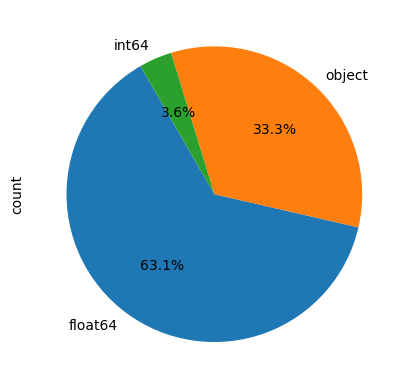

In [19]:
#afficher un graphique (pie chart) avec matplotlib des types de variables
#(ce n'est pas vraiment utile)
#autopct='%1.1f%%': permet d'afficher les pourcentages sur le graphique sous la forme d'une chaîne formatée
#%1.1f%% montre les pourcentages avec un chiffre avant la virgule et un chiffre après
#startangle=90: permet de démarrer le premier secteur à 120 degrés, pour améliorer la lisibilité du graphique
df.dtypes.value_counts().plot.pie(autopct='%1.1f%%', startangle=120)

In [20]:
#identifier les valeurs manquantes:
#pour ça on regarde le dataset en entier soit avec imshow soit avec heatmap

In [21]:
#vérifier si les valeurs des variables de df sont des NaN
df.isna()   # ça donne un masque

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Mycoplasma pneumoniae,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,"Influenza B, rapid test","Influenza A, rapid test",Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Strepto A,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Density,Urine - Urobilinogen,Urine - Protein,Urine - Sugar,Urine - Leukocytes,Urine - Crystals,Urine - Red blood cells,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
2,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True

<Axes: >

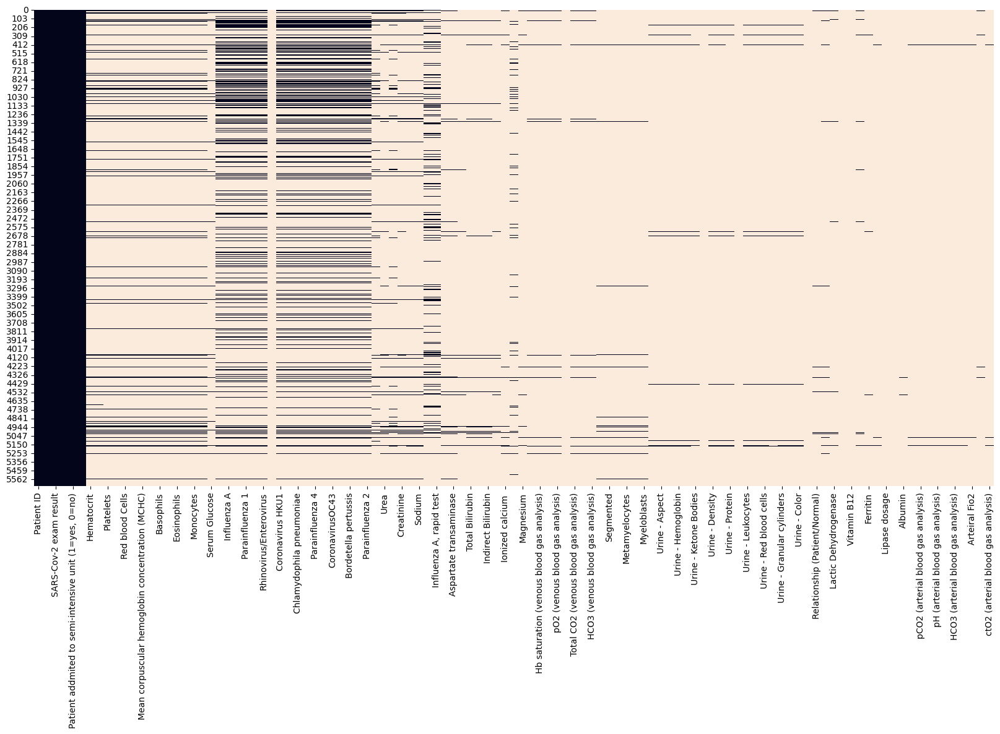

In [22]:
#créer une figure avec des dimensions personalisées
plt.figure(figsize=(20,10))

#afficher df avec heatmap
#cbar=False: indique si on affiche une barre de couleurs, ici False signifie non
sns.heatmap(df.isna(), cbar=False)

In [23]:
"""

Ici, on voit tout le dataset, avec toutes les lignes et toutes les colonnes:
- En blanc: on voit où il y a des valeurs manquantes.
- En noir: on voit où il y a des valeurs présentes.

On voit qu'il y a beaucoup de blanc, donc beaucoup de valeurs manquantes.
Toutes les colonnes qui sont sur la droite sont vides, donc c'est sûrement une zone qui va être éliminée par la suite lors du pre-processing.

On voit aussi des lignes, ce qui peut signifier 2 choses:
1. C'est une bonne nouvelle: on peut faire l'élimination des valeurs manquantes avec drop.na par la suite (potentiellement).
2. Ces variables qui forment des lignes ont sans doûte un rapport les unes avec les autres (astuce à garder à l'esprit).

"""

"\n\nIci, on voit tout le dataset, avec toutes les lignes et toutes les colonnes:\n- En blanc: on voit où il y a des valeurs manquantes.\n- En noir: on voit où il y a des valeurs présentes.\n\nOn voit qu'il y a beaucoup de blanc, donc beaucoup de valeurs manquantes.\nToutes les colonnes qui sont sur la droite sont vides, donc c'est sûrement une zone qui va être éliminée par la suite lors du pre-processing.\n\nOn voit aussi des lignes, ce qui peut signifier 2 choses:\n1. C'est une bonne nouvelle: on peut faire l'élimination des valeurs manquantes avec drop.na par la suite (potentiellement).\n2. Ces variables qui forment des lignes ont sans doûte un rapport les unes avec les autres (astuce à garder à l'esprit).\n\n"

### Les valeurs manquantes

In [25]:
#afficher la somme des valeurs maquantes dans chaque colonne
df.isna().sum()

Patient ID                                                  0
Patient age quantile                                        0
SARS-Cov-2 exam result                                      0
Patient addmited to regular ward (1=yes, 0=no)              0
Patient addmited to semi-intensive unit (1=yes, 0=no)       0
Patient addmited to intensive care unit (1=yes, 0=no)       0
Hematocrit                                               5041
Hemoglobin                                               5041
Platelets                                                5042
Mean platelet volume                                     5045
Red blood Cells                                          5042
Lymphocytes                                              5042
Mean corpuscular hemoglobin concentration (MCHC)         5042
Leukocytes                                               5042
Basophils                                                5042
Mean corpuscular hemoglobin (MCH)                        5042
Eosinoph

In [26]:
#afficher le % des valeurs maquantes dans chaque colonne de df

#df.isna().sum(): la somme des valeurs maquantes dans chaque colonne
#df.shape[0]: représente le nombre de lignes dans df
#(df.isna().sum()/df.shape[0]): la proportion (donc le %) des valeurs maquantes dans chaque colonne de df
#sort_values(): ordonne les valeurs
#ascending=True: signifie ordre croissant
(df.isna().sum()/df.shape[0]).sort_values(ascending=True)

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Influenza B                                              0.760099
Respiratory Syncytial Virus                              0.760099
Influenza A                                              0.760099
Rhinovirus/Enterovirus                                   0.760454
Inf A H1N1 2009                                          0.760454
CoronavirusOC43                                          0.760454
Coronavirus229E                                          0.760454
Parainfluenza 4                                          0.760454
Adenovirus                                               0.760454
Chlamydoph

In [27]:
"""

1. Les valeurs qui n'ont aucune valeur manquantes sont celles qui sont tout à gauche dans le heatmap (en noir)

2. On a des variables qui ont TOUTES 76% de valeurs manquantes, ce qui est intéressant, ça correspond aux lignes au milieu du heatmap (bcp de valeurs)

3. On a des variables qui ont TOUTES 89 à 90% de valeurs manquantes, ce qui est intéressant, ça correspond peut-être aux lignes tout à gauche du heatmap

3. On a des variables qui ont TOUTES 97% (et 98% et 99%) de valeurs manquantes, ce qui est intéressant, mais on ne veut pas compliquer la tâche.

On va peut être supprimer ici toutes les variables qui ont plus de 90% de valeurs manquantes dans le dataset:
ça va permettre de se concentrer sur les 2 groupes de variables: celles à 76% et celes à 89 à 90% de valeurs manquantes

"""

"\n\n1. Les valeurs qui n'ont aucune valeur manquantes sont celles qui sont tout à gauche dans le heatmap (en noir)\n\n2. On a des variables qui ont TOUTES 76% de valeurs manquantes, ce qui est intéressant, ça correspond aux lignes au milieu du heatmap (bcp de valeurs)\n\n3. On a des variables qui ont TOUTES 89 à 90% de valeurs manquantes, ce qui est intéressant, ça correspond peut-être aux lignes tout à gauche du heatmap\n\n3. On a des variables qui ont TOUTES 97% (et 98% et 99%) de valeurs manquantes, ce qui est intéressant, mais on ne veut pas compliquer la tâche.\n\nOn va peut être supprimer ici toutes les variables qui ont plus de 90% de valeurs manquantes dans le dataset:\nça va permettre de se concentrer sur les 2 groupes de variables: celles à 76% et celes à 89 à 90% de valeurs manquantes\n\n"

## Analyse du Fond

### Visulation initiale - Elimination des colonnes inutiles

In [30]:
"""
Ici on élimine toutes les colonnes qui sont inutiles:
en commençant par celles qui ont 100% de valeurs manquantes, puis (dans ce cas précis) on élimine les colonnes qui ont jusqu'à 90% de valeurs manquantes
"""

"\nIci on élimine toutes les colonnes qui sont inutiles:\nen commençant par celles qui ont 100% de valeurs manquantes, puis (dans ce cas précis) on élimine les colonnes qui ont jusqu'à 90% de valeurs manquantes\n"

In [31]:
#df.isna().sum(): la somme des valeurs maquantes dans chaque colonne
#df.shape[0]: représente le nombre total de lignes dans df
#(df.isna().sum()/df.shape[0]): la proportion (donc le %) des valeurs maquantes dans chaque colonne de df
#df.isna().sum()/df.shape[0] <0.9]: donne un masque pour les valeurs inférieures à 0.9
#df.columns[df.isna().sum()/df.shape[0] <0.9]: donne les colonnes où les valeurs inférieures à 0.9
df = df[df.columns[df.isna().sum()/df.shape[0] <0.9]]
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


In [32]:
#on sélectionne les colonnes du DataFrame 'df' qui contiennent moins de 90% de valeurs manquantes

#df.isna(): génère un DataFrame où chaque valeur est remplacée par True (si elle est manquante) ou False (si elle n'est pas manquante)
#df.sum(): calcule la somme des True pour chaque colonne, True équivaut à 1 et False à 0, cela donne le nombre total de valeurs manquantes dans chaque colonne
#df.shape[0]: donne le nombre total de lignes dans le DataFrame
#(df.isna().sum()/df.shape[0]): la proportion de valeurs manquantes par colonne
#df.columns[...]:renvoie l'index des colonnes du DataFrame df. C'est une liste de noms de colonnes
#df[df.columns[...] < 0.9]: sélectionne les colonnes du DataFrame 'df' qui contiennent moins de 90% de valeurs manquantes
#définir df
df = df[df.columns[df.isna().sum() / df.shape[0] < 0.9]]

#afficher les 5 premières lignes de df filtré pour vérifier le résultat  
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


In [33]:
#la forme de df
df.shape

(5644, 39)

In [34]:
#on voit qu'on est passé de 111 colonnes à 39 colonnes

<Axes: >

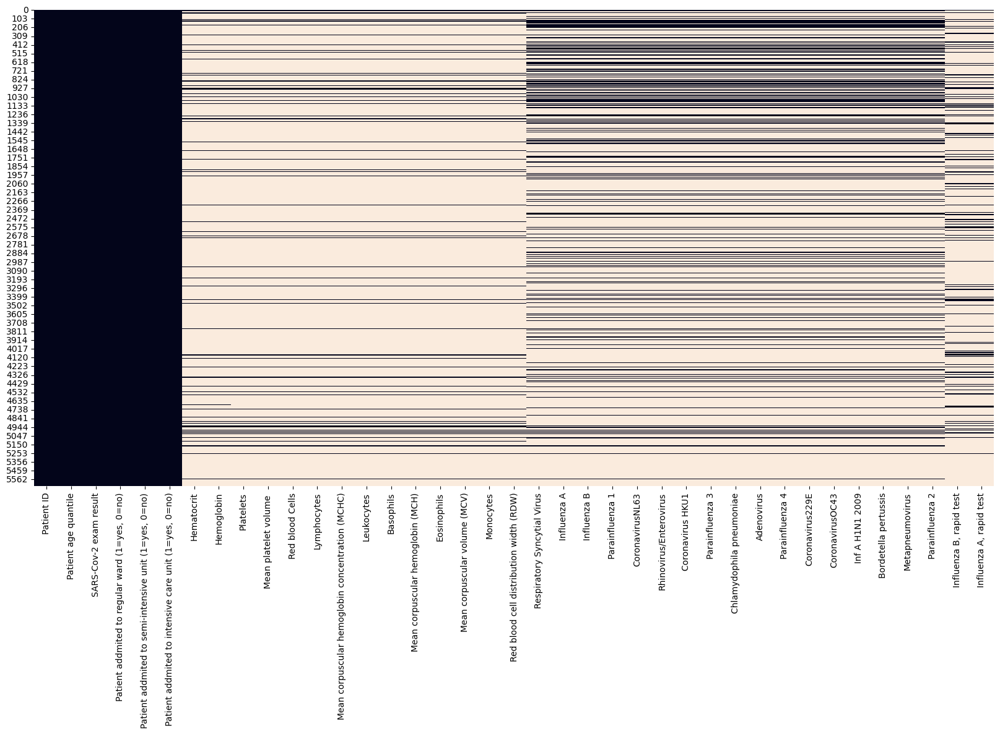

In [35]:
#créer une figure avec des dimensions personalisées
plt.figure(figsize=(20,10))

#afficher df avec heatmap pour vérifier les colonnes éliminées
#cbar=False: indique si on affiche une barre de couleurs, ici False signifie non
sns.heatmap(df.isna(), cbar=False)

In [36]:
'''
On voit qu'on a bien éliminé les colonnes inutiles
On élimine aussi la colonne Patient ID qui est inutile ici
'''

"\nOn voit qu'on a bien éliminé les colonnes inutiles\nOn élimine aussi la colonne Patient ID qui est inutile ici\n"

In [37]:
#éliminer la colonne Patient ID
#axis=1: signifie l'axe des colonnes
#définir df
df = df.drop('Patient ID', axis=1)

#afficher les 5 premières lignes de df (pour vérifier)
df.head()

,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


In [38]:
'''
Maintenant que le dataset est bien nettoyé,
on va pouvoir commencer par la visualisation de la target
'''

'\nMaintenant que le dataset est bien nettoyé,\non va pouvoir commencer par la visualisation de la target\n'

### Examen de la colonne target

In [40]:
#df['SARS-Cov-2 exam result'].value_counts(): le nombre d'apparition de chaque valeur dans la colonne SARS-Cov-2 exam result
#normalize=True: renvoie des proportions plutôt que le nombre d'apparition de chaque valeur (si = False, ou on n'écrit rien entres ())
df['SARS-Cov-2 exam result'].value_counts(normalize=True)

SARS-Cov-2 exam result
negative    0.901134
positive    0.098866
Name: proportion, dtype: float64

In [41]:
'''
Dans la colonne SARS-Cov-2 exam result, on a les proportions suivantes:
negative: 0.901134
positive: 0.098866
Donc, les 2 classes ne sont pas équilibrées dans ce problème.
Donc il faudra sûrement utiliser comme métrique: score f1, la sensibilité ou la précision
'''

'\nDans la colonne SARS-Cov-2 exam result, on a les proportions suivantes:\nnegative: 0.901134\npositive: 0.098866\nDonc, les 2 classes ne sont pas équilibrées dans ce problème.\nDonc il faudra sûrement utiliser comme métrique: score f1, la sensibilité ou la précision\n'

### Signification des variables

#### Variables Quantitatives

#### Les variables discontinues (discrètes/de type int)

In [45]:
#afficher toutes les colonnes de df qui sont de type int (variables discontinues/discrètes)
for col in df.select_dtypes('int'):  
    # afficher le nom de chaque colonne  
    print(col)

Patient age quantile
Patient addmited to regular ward (1=yes, 0=no)
Patient addmited to semi-intensive unit (1=yes, 0=no)
Patient addmited to intensive care unit (1=yes, 0=no)


In [46]:
#vérifier les différentes catégories qui résident dans chaque variable

#boucle for sur toutes les colonnes de type 'int' dans df
#df.select_dtypes('int'): extrait toutes les colonnes de df qui sont de type object
for col in df.select_dtypes('int'):  
    #imprimer le nom de la colonne (col) suivi des valeurs uniques dans cette colonne
    #df[col].unique(): retourne un tableau avec toutes les valeurs distinctes présentes dans la colonne (col)
    # le format de sortie utilise ':-<' pour aligner le texte à gauche avec des tirets jusqu'à 70 caractères
    #pour faciliter la lecture
    print(f'{col :-<70} {df[col].unique()}')

Patient age quantile-------------------------------------------------- [13 17  8  5 15  9 16  1 14 11  0  3 10  6 12 19  7 18  2  4]
Patient addmited to regular ward (1=yes, 0=no)------------------------ [0 1]
Patient addmited to semi-intensive unit (1=yes, 0=no)----------------- [0 1]
Patient addmited to intensive care unit (1=yes, 0=no)----------------- [0 1]


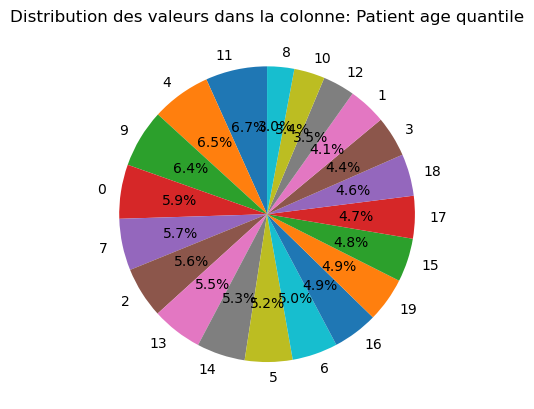

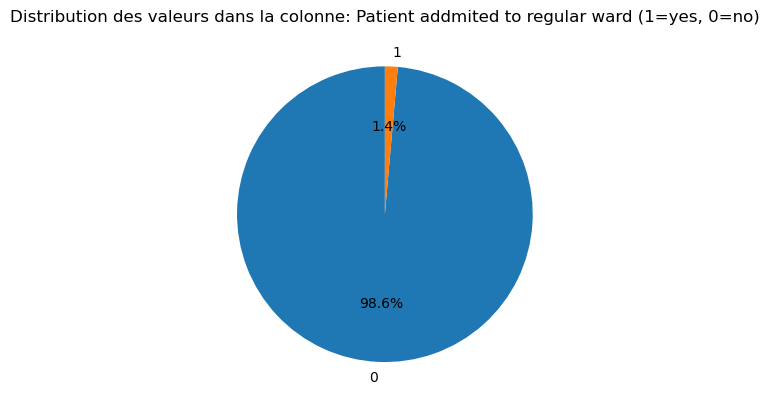

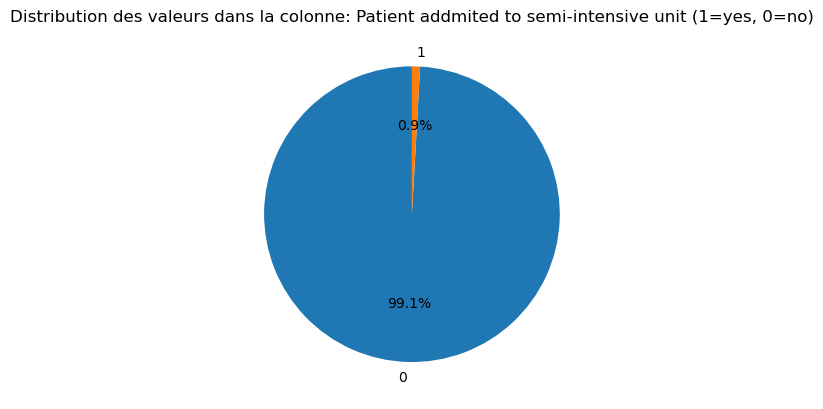

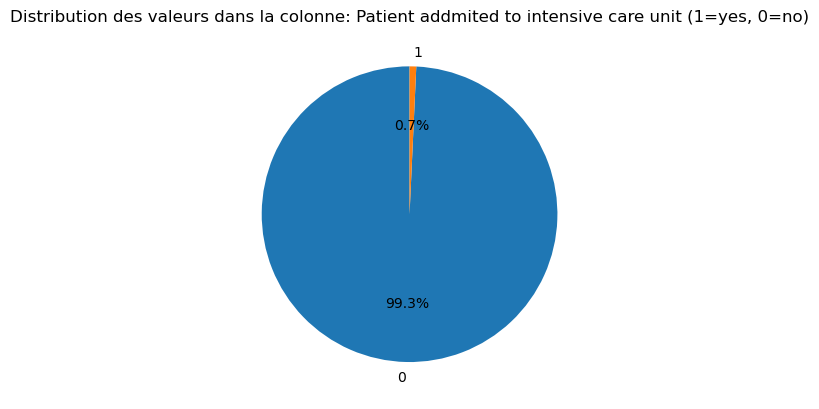

In [47]:
#compter le nombre d'apparition de chaque valeur/catégorie dans chaque variable

#boucle for sur toutes les colonnes de type 'int' dans df
#df.select_dtypes('int'): extrait toutes les colonnes de df qui sont de type int
for col in df.select_dtypes('int'):
    #créer une figure avec matplotlib
    plt.figure()
    #afficher le nombre d'apparition de chaque valeur/catégorie dans chaque colonne avec un pie chart
    #autopct='%1.1f%%': permet d'afficher les pourcentages sur le graphique sous la forme d'une chaîne formatée
    #%1.1f%% montre les pourcentages avec un chiffre avant la virgule et un chiffre après
    #startangle=90: permet de démarrer le premier secteur à 90 degrés, pour améliorer la lisibilité du graphique
    df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)

    #ajouter un titre au pie chart pour indiquer de quelle colonne il s'agit  
    plt.title(f'Distribution des valeurs dans la colonne: {col}')  
    #masquer l’étiquette de l'axe des y 
    plt.ylabel('')

In [48]:
'''
On voit que:
- les variables discontinues ont déjà été traitées
- elles représentent les types d'admissions dans l'hôpital
- elles sont toutes binaires à l'exception de la variable Patient age quantile
'''

"\nOn voit que:\n- les variables discontinues ont déjà été traitées\n- elles représentent les types d'admissions dans l'hôpital\n- elles sont toutes binaires à l'exception de la variable Patient age quantile\n"

- **Cas de la variable Patient age quantile:**

In [50]:
#le nombre d'apparition de chaque valeur de la colonne 'Patient age quantile'
df['Patient age quantile'].value_counts()

Patient age quantile
11    380
4     366
9     359
0     334
7     319
2     315
13    313
14    299
5     294
6     281
16    279
19    275
15    269
17    263
18    259
3     251
1     234
12    197
10    190
8     167
Name: count, dtype: int64

<Axes: xlabel='Patient age quantile', ylabel='Count'>

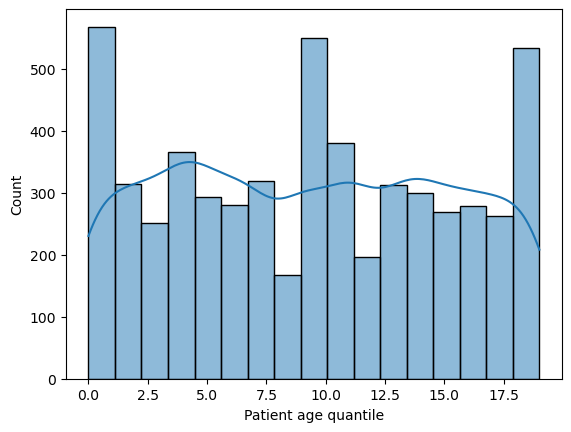

In [51]:
#tracer la distribution de la colonne 'Patient age quantile' avec histplot
#kde=True indique que la fonction doit également afficher la courbe de densité de probabilité sur le même graphique
#pour avoir une meilleure idée de la distribution des données
sns.histplot(df['Patient age quantile'], kde=True)

In [52]:
'''
On peut se demander:
- Pourquoi les valeurs de cette colonne vont de 0 à 20?
- Pourquoi la distribution des valeurs est comme ça?

Malheureusment, on n'a aucune information sur cette variable.
Donc tout ce qu'on peut faire c'est émettre des hypothèses.

Explication:

Hypothèse 1: Les valeurs de cette colonne vont de 0 à 100 ans, donc:
- 0 représente les personnes qui ont 0 à 5 ans,
- 1 représente les personnes qui ont 5 à 10 ans,
- 2 représente les personnes qui ont 10 à 15 ans,
...etc.

Hypothèse 2: Les valeurs de cette colonne ont été transformées de façon mathématique avec un quantile transformer.
'''

"\nOn peut se demander:\n- Pourquoi les valeurs de cette colonne vont de 0 à 20?\n- Pourquoi la distribution des valeurs est comme ça?\n\nMalheureusment, on n'a aucune information sur cette variable.\nDonc tout ce qu'on peut faire c'est émettre des hypothèses.\n\nExplication:\n\nHypothèse 1: Les valeurs de cette colonne vont de 0 à 100 ans, donc:\n- 0 représente les personnes qui ont 0 à 5 ans,\n- 1 représente les personnes qui ont 5 à 10 ans,\n- 2 représente les personnes qui ont 10 à 15 ans,\n...etc.\n\nHypothèse 2: Les valeurs de cette colonne ont été transformées de façon mathématique avec un quantile transformer.\n"

#### Les variables continues (de type float)

In [54]:
#afficher toutes les colonnes de df qui sont de type float
for col in df.select_dtypes('float'):  
    # afficher le nom de chaque colonne  
    print(col)

Hematocrit
Hemoglobin
Platelets
Mean platelet volume 
Red blood Cells
Lymphocytes
Mean corpuscular hemoglobin concentration (MCHC)
Leukocytes
Basophils
Mean corpuscular hemoglobin (MCH)
Eosinophils
Mean corpuscular volume (MCV)
Monocytes
Red blood cell distribution width (RDW)


In [55]:
'''
On observe la distribution des données pour chaque colonne
'''

'\nOn observe la distribution des données pour chaque colonne\n'

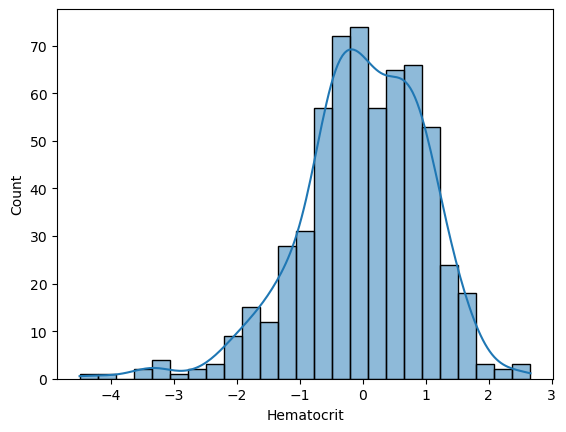

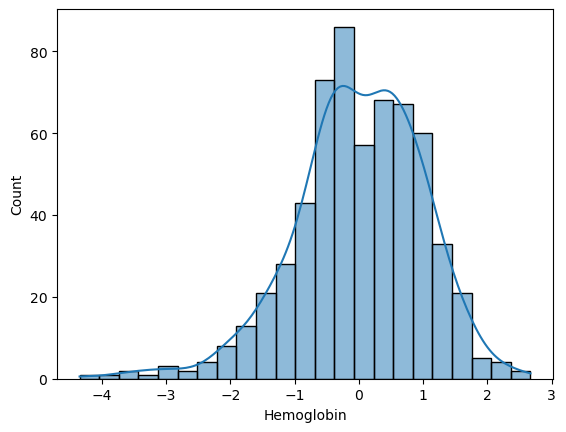

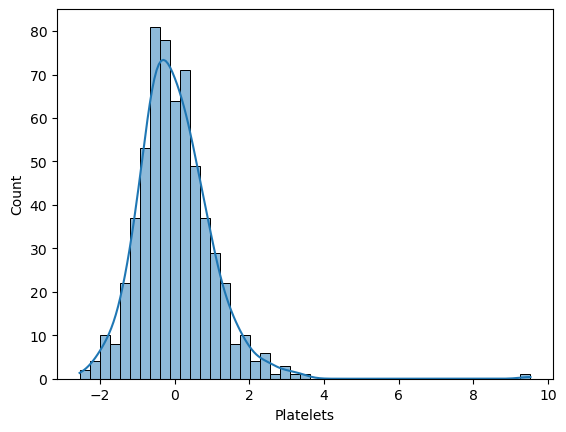

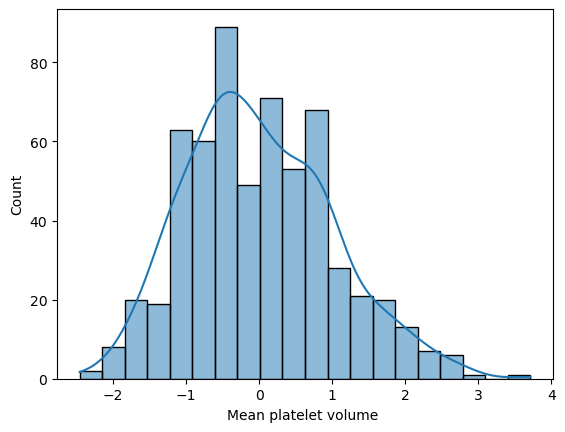

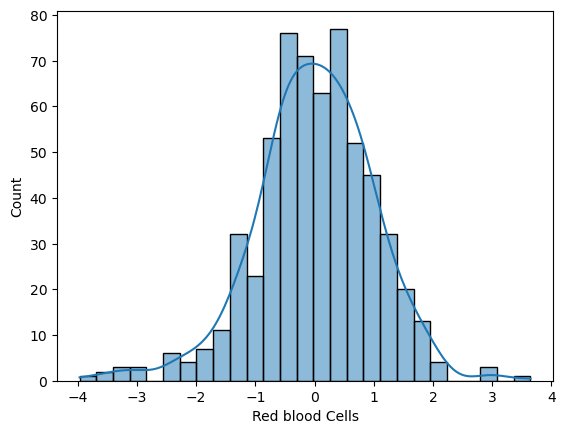

...

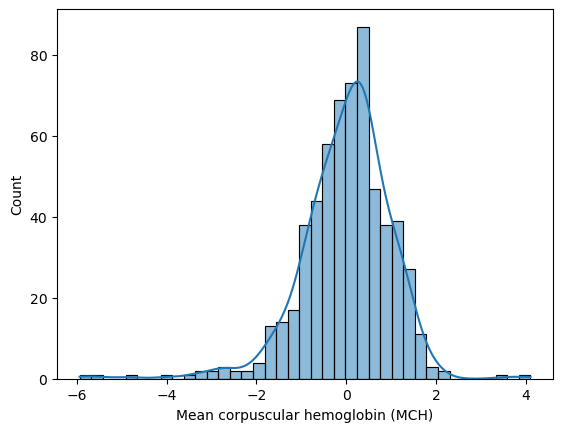

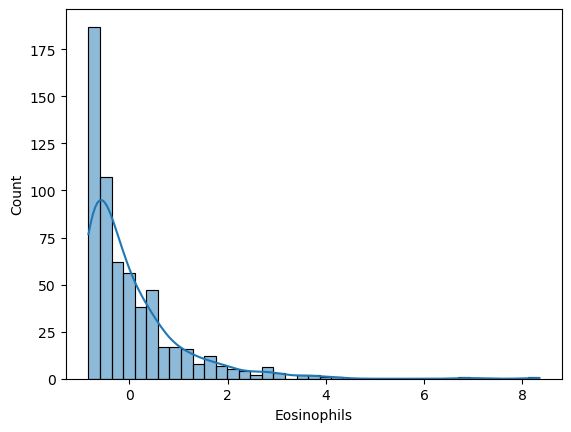

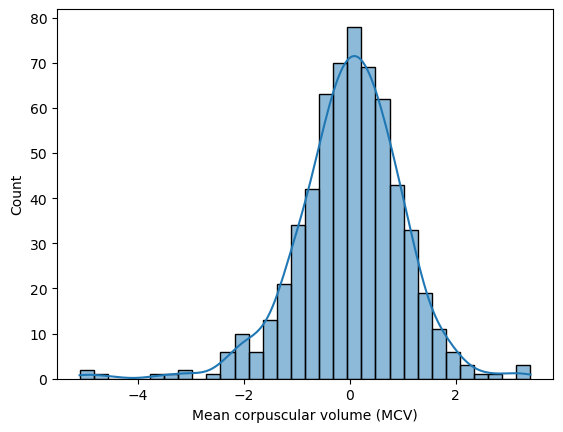

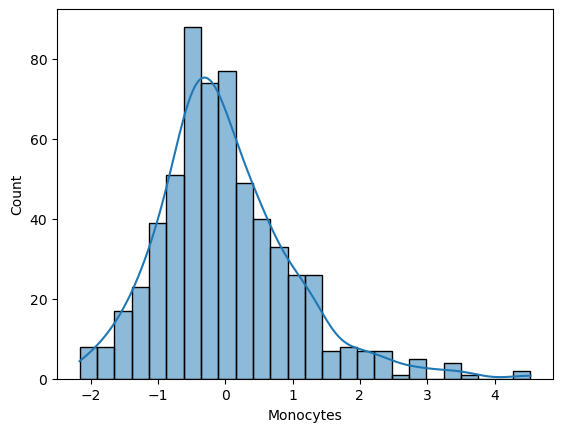

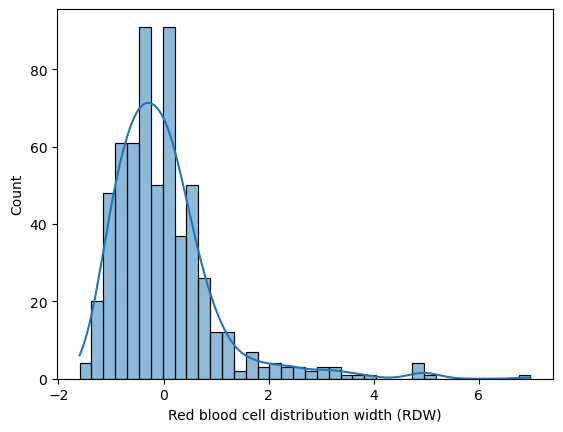

In [56]:
#afficher les histogrames des variables continues

#boucle for sur toutes les colonnes de type 'float' dans df
#df.select_dtypes('float'): extrait toutes les colonnes de df qui sont de type float
for col in df.select_dtypes('float'):  
    # créer une nouvelle figure pour chaque colonne  
    plt.figure()  
    #tracer la distribution de la colonne actuelle (col) avec histplot
    #kde=True indique que la fonction doit également afficher la courbe de densité de probabilité sur le même graphique
    #pour avoir une meilleure idée de la distribution des données
    sns.histplot(df[col], kde=True)

In [57]:
'''
Remarque 1:
- Toutes les courbes sont centrées en 0
- Elles ont l'air d'avoir un écart-type = 1

Déduction:
Ces données ont été standardisées.

Remarque 2:
- Certaines variables suivent une distribution normale
- D'autres ont des distributions asymétriques (skewed)
'''

"\nRemarque 1:\n- Toutes les courbes sont centrées en 0\n- Elles ont l'air d'avoir un écart-type = 1\n\nDéduction:\nCes données ont été standardisées.\n\nRemarque 2:\n- Certaines variables suivent une distribution normale\n- D'autres ont des distributions asymétriques (skewed)\n"

#### Variables Qualitatives

In [59]:
'''
1. On vérifie les différentes catégories qui résident dans chaque variable.
(exp: dans la variabble target on a 2 catégories: positif et négatif)
2. On compte le nombre d'apparition de chaque valeur/catégorie dans chaque variable.
'''

"\n1. On vérifie les différentes catégories qui résident dans chaque variable.\n(exp: dans la variabble target on a 2 catégories: positif et négatif)\n2. On compte le nombre d'apparition de chaque valeur/catégorie dans chaque variable.\n"

In [60]:
#afficher toutes les colonnes de df qui sont de type object
for col in df.select_dtypes('object'):  
    # afficher le nom de chaque colonne  
    print(col)

SARS-Cov-2 exam result
Respiratory Syncytial Virus
Influenza A
Influenza B
Parainfluenza 1
CoronavirusNL63
Rhinovirus/Enterovirus
Coronavirus HKU1
Parainfluenza 3
Chlamydophila pneumoniae
Adenovirus
Parainfluenza 4
Coronavirus229E
CoronavirusOC43
Inf A H1N1 2009
Bordetella pertussis
Metapneumovirus
Parainfluenza 2
Influenza B, rapid test
Influenza A, rapid test


In [61]:
#vérifier les différentes catégories qui résident dans chaque variable

#boucle for sur toutes les colonnes de type 'object' dans df
#df.select_dtypes('object'): extrait toutes les colonnes de df qui sont de type object
for col in df.select_dtypes('object'):  
    #imprimer le nom de la colonne (col) suivi des valeurs uniques dans cette colonne
    #df[col].unique(): retourne un tableau avec toutes les valeurs distinctes présentes dans la colonne (col)
    # le format de sortie utilise ':-<' pour aligner le texte à gauche avec des tirets jusqu'à 50 caractères
    #pour faciliter la lecture
    print(f'{col :-<50} {df[col].unique()}')

SARS-Cov-2 exam result---------------------------- ['negative' 'positive']
Respiratory Syncytial Virus----------------------- [nan 'not_detected' 'detected']
Influenza A--------------------------------------- [nan 'not_detected' 'detected']
Influenza B--------------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 1----------------------------------- [nan 'not_detected' 'detected']
CoronavirusNL63----------------------------------- [nan 'not_detected' 'detected']
Rhinovirus/Enterovirus---------------------------- [nan 'detected' 'not_detected']
Coronavirus HKU1---------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 3----------------------------------- [nan 'not_detected' 'detected']
Chlamydophila pneumoniae-------------------------- [nan 'not_detected' 'detected']
Adenovirus---------------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 4----------------------------------- [nan 'not_detected' 'detected']
Coronavirus2

In [62]:
'''
On voit que:
- toutes les variables qualitatives sont binaires
- elles sont des tests viraux
- la colonne 'Parainfluenza 2' a une seule valeur, donc elle ne va servir à rien dans ce problème.
'''

"\nOn voit que:\n- toutes les variables qualitatives sont binaires\n- elles sont des tests viraux\n- la colonne 'Parainfluenza 2' a une seule valeur, donc elle ne va servir à rien dans ce problème.\n"

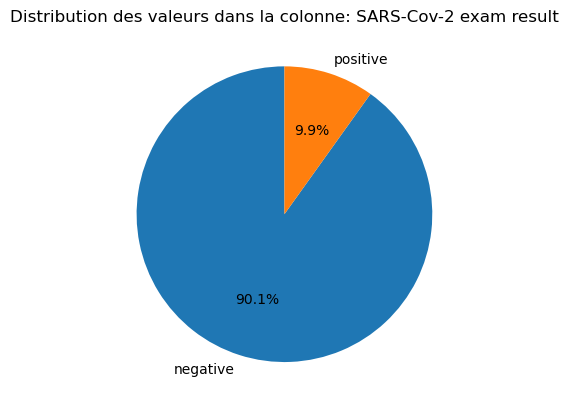

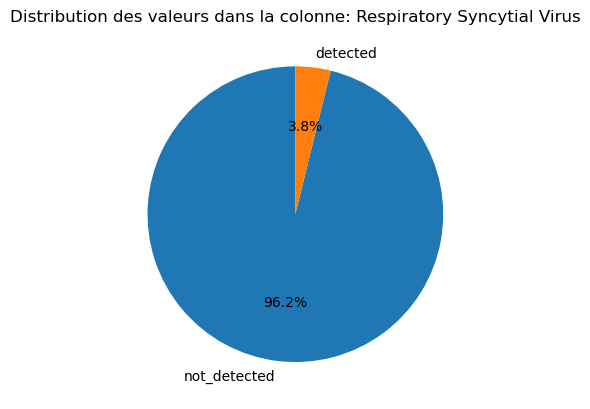

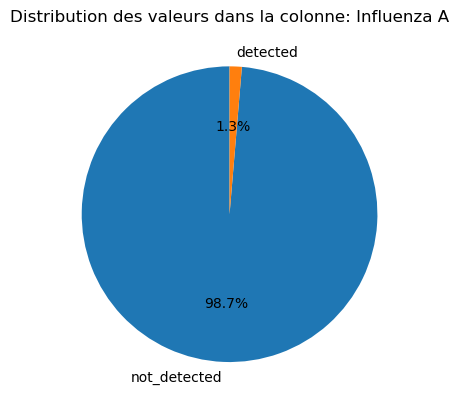

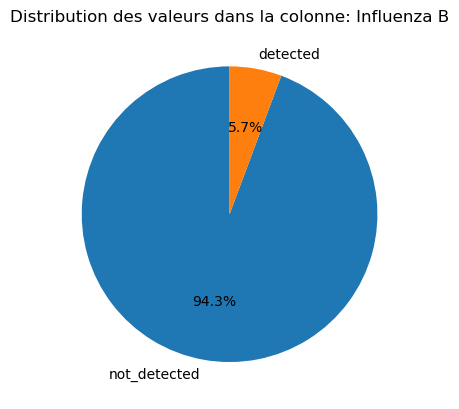

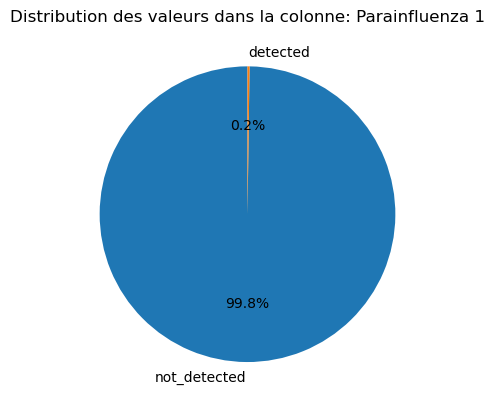

...

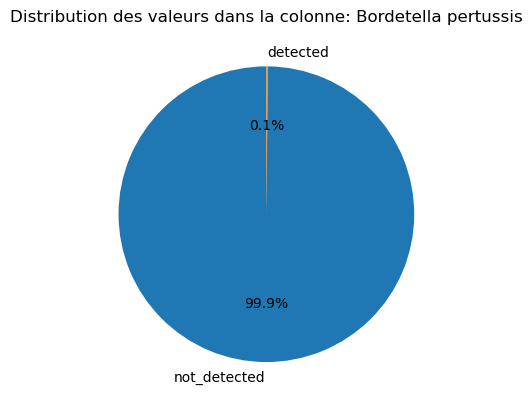

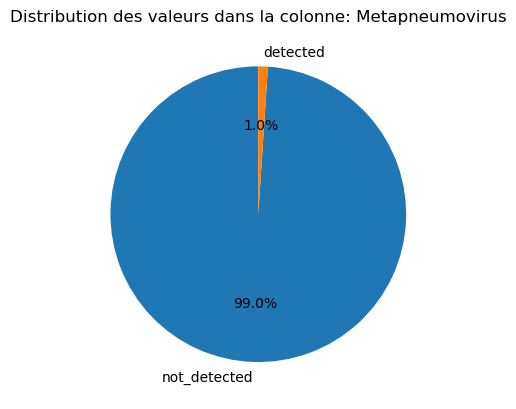

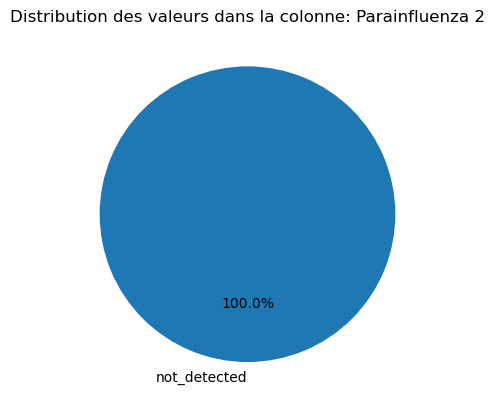

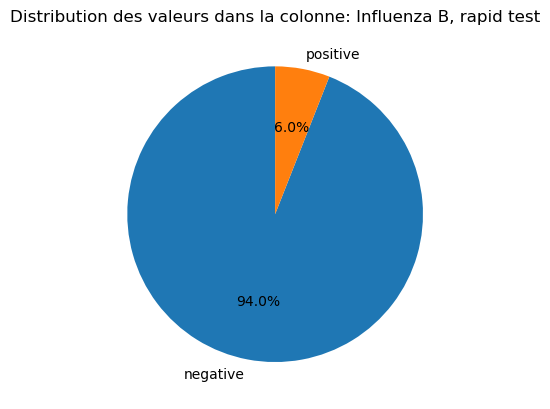

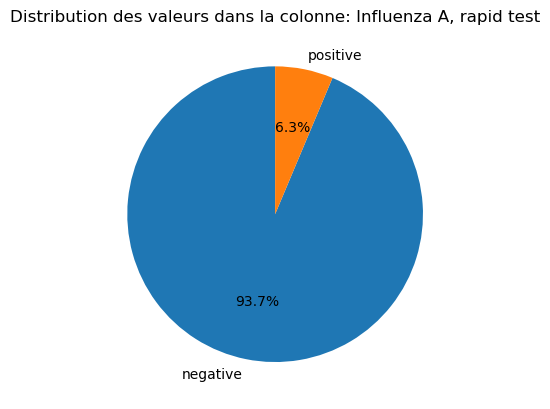

In [63]:
#compter le nombre d'apparition de chaque valeur/catégorie dans chaque variable

#boucle for sur toutes les colonnes de type 'object' dans df
#df.select_dtypes('object'): extrait toutes les colonnes de df qui sont de type object
for col in df.select_dtypes('object'):
    #créer une figure avec matplotlib
    plt.figure()
    #afficher le nombre d'apparition de chaque valeur/catégorie dans chaque colonne avec un pie chart
    #autopct='%1.1f%%': permet d'afficher les pourcentages sur le graphique sous la forme d'une chaîne formatée
    #%1.1f%% montre les pourcentages avec un chiffre avant la virgule et un chiffre après
    #startangle=90: permet de démarrer le premier secteur à 90 degrés, pour améliorer la lisibilité du graphique
    df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)

    #ajouter un titre au pie chart pour indiquer de quelle colonne il s'agit  
    plt.title(f'Distribution des valeurs dans la colonne: {col}')  
    #masquer l’étiquette de l'axe des y 
    plt.ylabel('')

In [64]:
'''
On voit que la majorité des tests viraux sont négatifs, à l'exception de Rhinovirus/Enterovirus
'''

"\nOn voit que la majorité des tests viraux sont négatifs, à l'exception de Rhinovirus/Enterovirus\n"

### Relation Variables/target

In [66]:
'''
Etant donné qu'on a 2 groupes d'individus: positifs et négatifs.
On crée alors, pour faciliter l'analyse après, des sous-ensembles: positifs et négatifs.
Pour faire ça avec Pandas, en général en fait du boolean indexing.
'''

"\nEtant donné qu'on a 2 groupes d'individus: positifs et négatifs.\nOn crée alors, pour faciliter l'analyse après, des sous-ensembles: positifs et négatifs.\nPour faire ça avec Pandas, en général en fait du boolean indexing.\n"

#### Création de sous-ensembles: positifs et négatifs

#### La target: SARS-Cov-2 exam result

- **Sous-ensemble des individus positifs**

In [70]:
#créer un maque où toutes les valeurs de SARS-Cov-2 exam result sont 'positive'

#df['SARS-Cov-2 exam result']: représente la colonne SARS-Cov-2 exam result
df['SARS-Cov-2 exam result'] == 'positive'

0       False
1       False
2       False
3       False
4       False
        ...  
5639     True
5640    False
5641    False
5642    False
5643     True
Name: SARS-Cov-2 exam result, Length: 5644, dtype: bool

In [71]:
#créer le 1er sous-ensemble des individus positifs de la target (SARS-Cov-2 exam result)

#injecter le masque sur df
#df où les valeurs de SARS-Cov-2 exam result sont 'positive'
df[df['SARS-Cov-2 exam result'] == 'positive']

#enregistrer le resultat dans la variable positive_df
positive_df = df[df['SARS-Cov-2 exam result'] == 'positive']

#afficher la forme de positive_df (pour vérifier)
positive_df.shape

(558, 38)

In [72]:
'''
On voit qu'il n'y a ici que 558 lignes.
Donc: 558 individus qui ont un résultat de test (càd la target SARS-Cov-2 exam result) positif.
'''

"\nOn voit qu'il n'y a ici que 558 lignes.\nDonc: 558 individus qui ont un résultat de test (càd la target SARS-Cov-2 exam result) positif.\n"

- **Sous-ensemble des individus négatifs:**

De la même manière, on crée le 2ème sous-ensemble.

In [74]:
#créer le 2ème sous-ensemble des individus négatifs de la target (SARS-Cov-2 exam result)

#enregistrer le resultat dans la variable negative_df
negative_df = df[df['SARS-Cov-2 exam result'] == 'negative']

#afficher la forme de negative_df (pour vérifier)
negative_df.shape

(5086, 38)

In [75]:
'''
On voit qu'il y a ici 5086 lignes.
Donc: 5086 individus qui ont un résultat de test (càd la target SARS-Cov-2 exam result) négatif.
'''

"\nOn voit qu'il y a ici 5086 lignes.\nDonc: 5086 individus qui ont un résultat de test (càd la target SARS-Cov-2 exam result) négatif.\n"

#### Les variables: features

In [77]:
'''
Etant donné qu'on a 2 groupes d'individus: test viral et bilan hématologique.
On crée alors, pour faciliter l'analyse après, des sous-ensembles: blood (bilan hématologique) et viral (test viral).

Pour faire ça, on applique des calculs sur les valeurs manquantes qu'on a dans chaque variable,
puisqu'on a vu déjà que: blood avait 89% de valeurs manquantes et viral en avait 76%.
'''

"\nEtant donné qu'on a 2 groupes d'individus: test viral et bilan hématologique.\nOn crée alors, pour faciliter l'analyse après, des sous-ensembles: blood (bilan hématologique) et viral (test viral).\n\nPour faire ça, on applique des calculs sur les valeurs manquantes qu'on a dans chaque variable,\npuisqu'on a vu déjà que: blood avait 89% de valeurs manquantes et viral en avait 76%.\n"

#### Création de sous-ensembles: Blood et Viral

In [79]:
#afficher le % des valeurs maquantes dans chaque colonne de df

#df.isna().sum(): la somme des valeurs maquantes dans chaque colonne
#df.shape[0]: représente le nombre de lignes dans df
#(df.isna().sum()/df.shape[0]): la proportion (donc le %) des valeurs maquantes dans chaque colonne de df
#sort_values(): ordonne les valeurs
#ascending=True: trie le taux des valeurs manquantes par ordre croissant
(df.isna().sum()/df.shape[0]).sort_values(ascending=True)

Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Respiratory Syncytial Virus                              0.760099
Influenza A                                              0.760099
Influenza B                                              0.760099
Inf A H1N1 2009                                          0.760454
CoronavirusOC43                                          0.760454
Metapneumovirus                                          0.760454
Parainfluenza 4                                          0.760454
Adenovirus                                               0.760454
Chlamydophila pneumoniae                                 0.760454
Parainfluenza 3                                          0.760454
Coronaviru

In [80]:
#enregistrer sous la variable appelée missing_rate
missing_rate = (df.isna().sum()/df.shape[0]).sort_values(ascending=True)

In [81]:
"""
En observant les valeurs de % des valeurs maquantes dans chaque colonne de df, on voit qu:

-Groupe 1: des variables qui ont 0% de valeurs manquantes:
correspondent aux types d'admissions dans l'hôpital
-Groupe 2: des variables qui ont 76% de valeurs manquantes + 2 variables qui ont 85% de valeurs manquantes:
correspondent aux variables de type test viral
-Groupe 3: des variables qui ont 89% de valeurs manquantes:
correspondent aux variables du bilan hématologique (taux sanguins)

Donc:

On va créer 2 sous-ensembles de variables:
-viral_columns:
0.75 < missing_rate < 0.88 (des variables qui ont TOUTES 76% de valeurs manquantes + 2 variables qui ont 85% de valeurs manquantes)
-blood_columns:
0.88 < missing_rate < 0.9 (des variables qui ont TOUTES 89% de valeurs manquantes)

"""

"\nEn observant les valeurs de % des valeurs maquantes dans chaque colonne de df, on voit qu:\n\n-Groupe 1: des variables qui ont 0% de valeurs manquantes:\ncorrespondent aux types d'admissions dans l'hôpital\n-Groupe 2: des variables qui ont 76% de valeurs manquantes + 2 variables qui ont 85% de valeurs manquantes:\ncorrespondent aux variables de type test viral\n-Groupe 3: des variables qui ont 89% de valeurs manquantes:\ncorrespondent aux variables du bilan hématologique (taux sanguins)\n\nDonc:\n\nOn va créer 2 sous-ensembles de variables:\n-viral_columns:\n0.75 < missing_rate < 0.88 (des variables qui ont TOUTES 76% de valeurs manquantes + 2 variables qui ont 85% de valeurs manquantes)\n-blood_columns:\n0.88 < missing_rate < 0.9 (des variables qui ont TOUTES 89% de valeurs manquantes)\n\n"

- **Filtrer le dataset:**
  - **création des groupes: blood_columns et viral_columns**

In [83]:
#groupe 1, les cas où: 0.75 < missing_rate < 0.88

(missing_rate > 0.75) & (missing_rate < 0.88)      #ça donne un masque boolean

Patient age quantile                                     False
SARS-Cov-2 exam result                                   False
Patient addmited to regular ward (1=yes, 0=no)           False
Patient addmited to semi-intensive unit (1=yes, 0=no)    False
Patient addmited to intensive care unit (1=yes, 0=no)    False
Respiratory Syncytial Virus                               True
Influenza A                                               True
Influenza B                                               True
Inf A H1N1 2009                                           True
CoronavirusOC43                                           True
Metapneumovirus                                           True
Parainfluenza 4                                           True
Adenovirus                                                True
Chlamydophila pneumoniae                                  True
Parainfluenza 3                                           True
Coronavirus HKU1                                       

In [84]:
#vérifier les colonnes où: 0.75 < missing_rate < 0.88

#injecter le masque à df.columns
#df.columns: les noms des colonnes de df
df.columns[(missing_rate > 0.75) & (missing_rate < 0.88)]

Index(['Hematocrit', 'Hemoglobin', 'Platelets', 'Mean platelet volume ',
       'Red blood Cells', 'Lymphocytes',
       'Mean corpuscular hemoglobin concentration (MCHC)', 'Leukocytes',
       'Basophils', 'Mean corpuscular hemoglobin (MCH)', 'Eosinophils',
       'Mean corpuscular volume (MCV)', 'Monocytes',
       'Red blood cell distribution width (RDW)',
       'Respiratory Syncytial Virus', 'Influenza A', 'Influenza B',
       'Parainfluenza 1', 'CoronavirusNL63'],
      dtype='object')

In [85]:
"""
Pour une raison inconnue, le boolean indexing ne marche pas bien, même si on a un bon masque boolean
On utilise alors la boucle for:
1. On classe les colonnes selon les valeurs de missing_rate
2. création des sous-ensembles pour faciliter l'analyse
"""

"\nPour une raison inconnue, le boolean indexing ne marche pas bien, même si on a un bon masque boolean\nOn utilise alors la boucle for:\n1. On classe les colonnes selon les valeurs de missing_rate\n2. création des sous-ensembles pour faciliter l'analyse\n"

In [86]:
#la boucle for pour classer les variables (colonnes)

#parcourir chaque colonne dans l'index de 'missing_rate'
for col in missing_rate.index:  
    #vérifier si le taux de valeurs manquantes est supérieur ou égal à 88%  
    if missing_rate[col] >= 0.88:  
        #afficher le nom de la colonne, le taux de valeurs manquantes, et indiquer qu'elle est exclue  
        print(f"{col}: {missing_rate[col]} (Exclue)")  
    #vérifier si le taux de valeurs manquantes est entre 75% et 88%  
    elif 0.75 < missing_rate[col] < 0.88:  
        #afficher le nom de la colonne, le taux de valeurs manquantes, et indiquer qu'elle est inclue  
        print(f"{col}: {missing_rate[col]} (Inclue)")  
    else:  
        #pour tout autre taux de valeurs manquantes (inférieur ou égal à 75%)  
        #afficher le nom de la colonne, le taux de valeurs manquantes, et indiquer qu'elle est exclue  
        print(f"{col}: {missing_rate[col]} (Exclue)")

Patient age quantile: 0.0 (Exclue)
SARS-Cov-2 exam result: 0.0 (Exclue)
Patient addmited to regular ward (1=yes, 0=no): 0.0 (Exclue)
Patient addmited to semi-intensive unit (1=yes, 0=no): 0.0 (Exclue)
Patient addmited to intensive care unit (1=yes, 0=no): 0.0 (Exclue)
Respiratory Syncytial Virus: 0.760099220411056 (Inclue)
Influenza A: 0.760099220411056 (Inclue)
Influenza B: 0.760099220411056 (Inclue)
Inf A H1N1 2009: 0.7604535790219702 (Inclue)
CoronavirusOC43: 0.7604535790219702 (Inclue)
Metapneumovirus: 0.7604535790219702 (Inclue)
Parainfluenza 4: 0.7604535790219702 (Inclue)
Adenovirus: 0.7604535790219702 (Inclue)
Chlamydophila pneumoniae: 0.7604535790219702 (Inclue)
Parainfluenza 3: 0.7604535790219702 (Inclue)
Coronavirus HKU1: 0.7604535790219702 (Inclue)
Rhinovirus/Enterovirus: 0.7604535790219702 (Inclue)
CoronavirusNL63: 0.7604535790219702 (Inclue)
Parainfluenza 1: 0.7604535790219702 (Inclue)
Parainfluenza 2: 0.7604535790219702 (Inclue)
Bordetella pertussis: 0.7604535790219702 (I

In [87]:
#la boucle for marche bien!

In [88]:
#définir blood_columns et viral_columns
blood_columns = []    #liste vide
viral_columns = []    #liste vide

#la boucle for pour classer les variables (colonnes)

#parcourir chaque colonne dans l'index de 'missing_rate' 
for col in missing_rate.index:  
    #vérifier si le taux de valeurs manquantes est supérieur ou égal à 88%
    if missing_rate[col] >= 0.88:  
        #ajouter la colonne à blood_columns si elle répond à la condition  
        blood_columns.append(col)   
    #vérifier si le taux de valeurs manquantes est entre 75% et 88%
    elif 0.75 < missing_rate[col] < 0.88:  
        #ajouter la colonne à viral_columns si elle répond à la condition  
        viral_columns.append(col)

#convertir les listes en index pour faciliter l'utilisation  
blood_columns = pd.Index(blood_columns)  
viral_columns = pd.Index(viral_columns)

In [89]:
#sort_values(ascending=True): trier les noms des colonnes par ordre alphabetique
#et définir blood_columns
blood_columns = blood_columns.sort_values(ascending=True)

#afficher blood_columns pour vérifier
blood_columns

Index(['Basophils', 'Eosinophils', 'Hematocrit', 'Hemoglobin', 'Leukocytes',
       'Lymphocytes', 'Mean corpuscular hemoglobin (MCH)',
       'Mean corpuscular hemoglobin concentration (MCHC)',
       'Mean corpuscular volume (MCV)', 'Mean platelet volume ', 'Monocytes',
       'Platelets', 'Red blood Cells',
       'Red blood cell distribution width (RDW)'],
      dtype='object')

In [90]:
#sort_values(ascending=True): trier les noms des colonnes par ordre alphabetique
#et définir blood_columns
viral_columns = viral_columns.sort_values(ascending=True)

#afficher viral_columns pour vérifier
viral_columns

Index(['Adenovirus', 'Bordetella pertussis', 'Chlamydophila pneumoniae',
       'Coronavirus HKU1', 'Coronavirus229E', 'CoronavirusNL63',
       'CoronavirusOC43', 'Inf A H1N1 2009', 'Influenza A',
       'Influenza A, rapid test', 'Influenza B', 'Influenza B, rapid test',
       'Metapneumovirus', 'Parainfluenza 1', 'Parainfluenza 2',
       'Parainfluenza 3', 'Parainfluenza 4', 'Respiratory Syncytial Virus',
       'Rhinovirus/Enterovirus'],
      dtype='object')

In [91]:
"""
Cette technique a bien marché!
On distinguant les 2 groupes (blood_columns et viral_columns),
on va pouvoir visualiser les relations Target/variables de façon plus efficace.
"""

'\nCette technique a bien marché!\nOn distinguant les 2 groupes (blood_columns et viral_columns),\non va pouvoir visualiser les relations Target/variables de façon plus efficace.\n'

### Relation Target/Blood

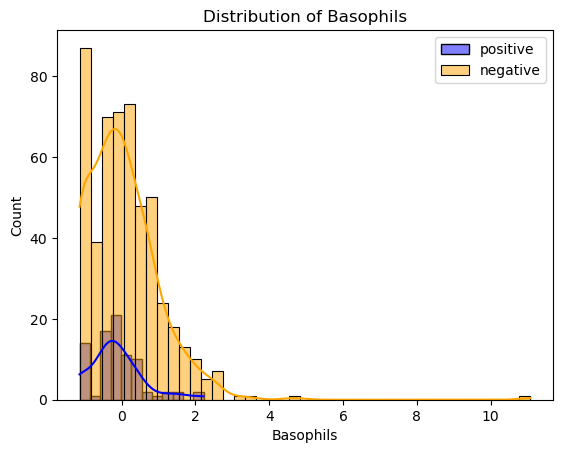

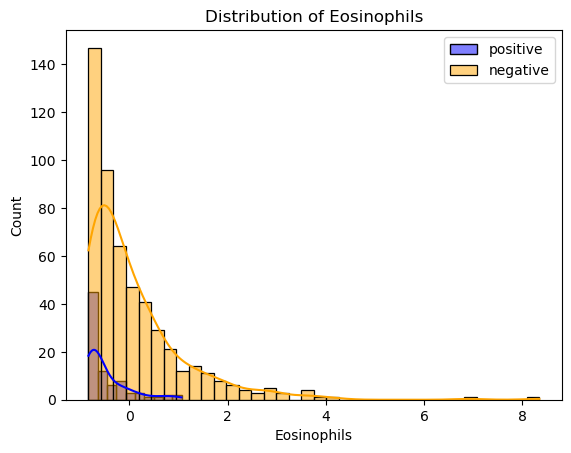

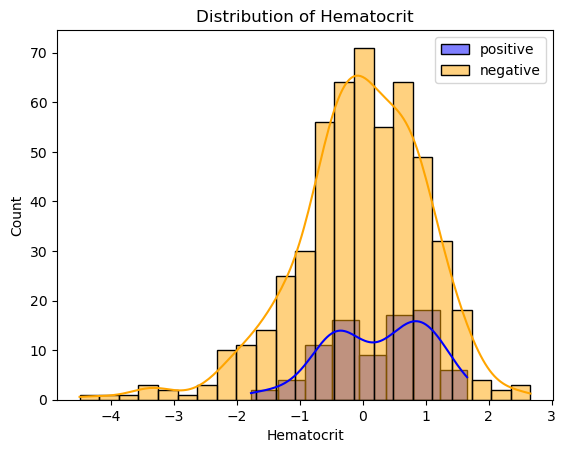

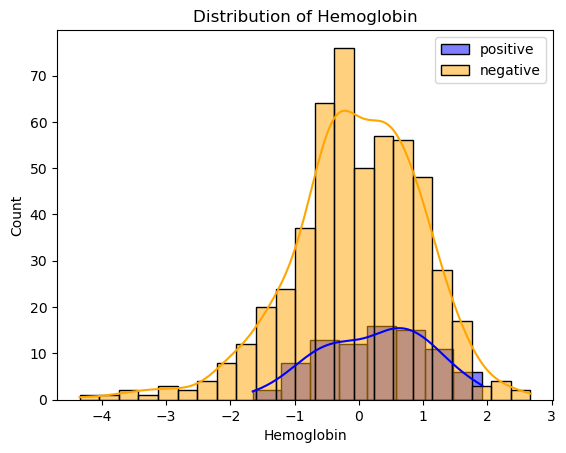

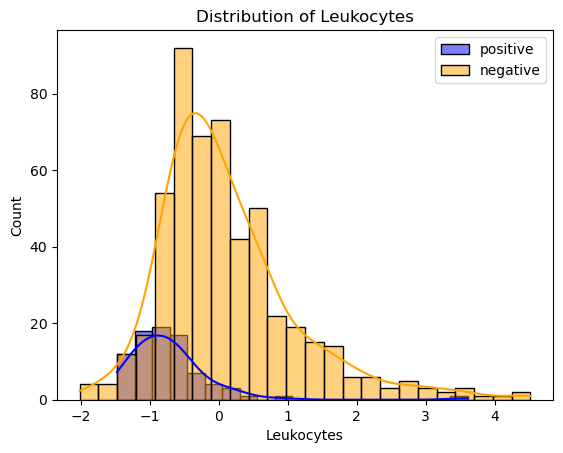

...

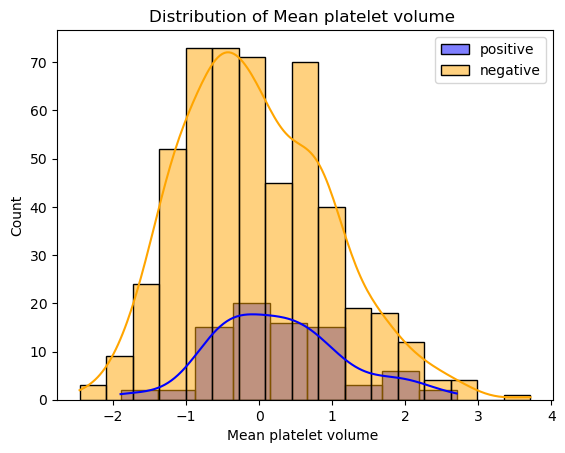

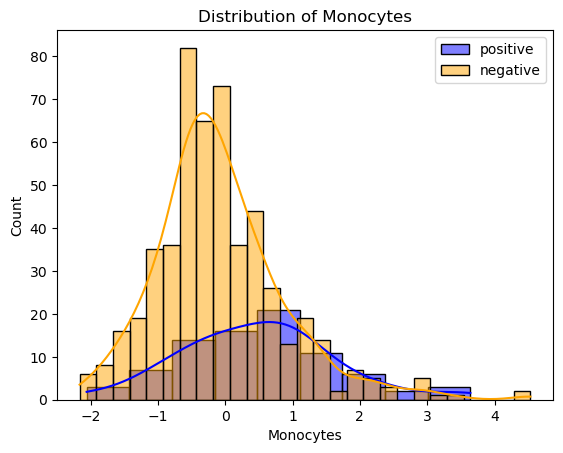

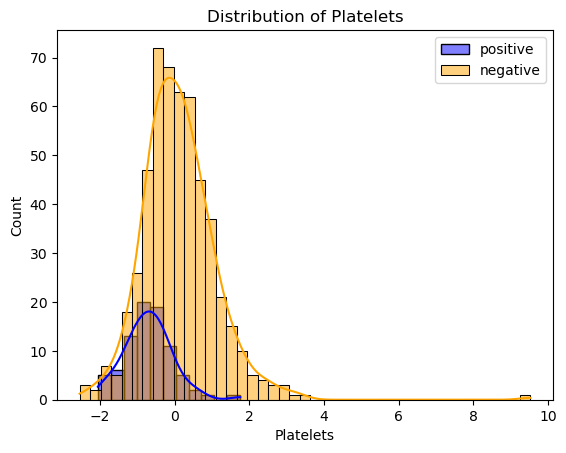

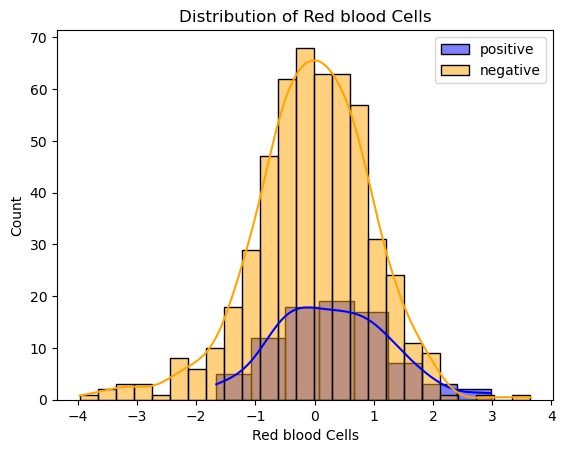

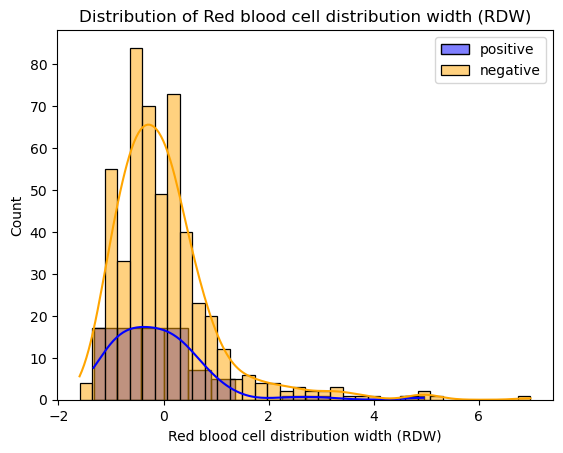

In [93]:
#parcourir chaque colonne spécifiée dans la liste blood_columns  
for col in blood_columns:  
    #créer une nouvelle figure pour chaque variable  
    plt.figure()  
    
    #tracer la distribution des valeurs dans la colonne 'col' pour positive_df  
    #label='positive': légender 'positive'  
    sns.histplot(positive_df[col], kde=True, color='Blue', label='positive')  
    
    #tracer la distribution des valeurs dans la colonne 'col' pour negative_df  
    #label='negative': légender 'negative'  
    sns.histplot(negative_df[col], kde=True, color='Orange', label='negative')
    
    #ajouter une légende pour distinguer les distributions  
    plt.legend()
    
    #ajouter un titre au graphique pour plus de clarté  
    plt.title(f'Distribution of {col}')

In [94]:
'''
On voit que les individus qui ont des tests négatifs de SARS-Cov-2 exam result,
ont des taux beaucoup plus élevés de composants du sang (résultats du bilan hématologique),
comparés aux individus avec des tests négatifs de SARS-Cov-2 exam result.

Donc:
=> les reslutats des tests sanguins semblent liés au covid-19 -> hypothèse à tester
'''

'\nOn voit que les individus qui ont des tests négatifs de SARS-Cov-2 exam result,\nont des taux beaucoup plus élevés de composants du sang (résultats du bilan hématologique),\ncomparés aux individus avec des tests négatifs de SARS-Cov-2 exam result.\n\nDonc:\n=> les reslutats des tests sanguins semblent liés au covid-19 -> hypothèse à tester\n'

### Relation Target/age

In [96]:
'''
On utilise la même technique que tout à l'heure mais on utilise ici une autre technique (à bien retenir aussi)
'''

"\nOn utilise la même technique que tout à l'heure mais on utilise ici une autre technique (à bien retenir aussi)\n"

<Axes: xlabel='Patient age quantile', ylabel='count'>

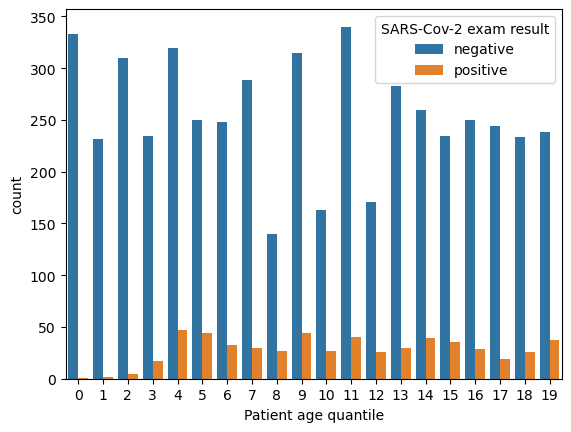

In [97]:
#afficher la distribution de la variable Patient age quantile avec seaborn
#en distinguant les groupes negative et positive de la variable SARS-Cov-2 exam result

#x='Patient age quantile': définit l'axe des abscisses (les x)
#hue='SARS-Cov-2 exam result': signifie la distinction entre les catégories de la variable SARS-Cov-2 exam result
#data=df: représente les données utilisées
sns.countplot(x='Patient age quantile', hue='SARS-Cov-2 exam result', data=df)

In [98]:
'''
Ce graphique compte le nombre d'apparition de chaque valeur de Patient age quantile pour les résultats positifs et négatifs de la target (SARS-...)

Il semble qu'il y a une relation entre la target (SARS-...) et l'âge du patient (Patient age...):
1- Les individus de faible âge sont très peu contaminés, attention on ne connaît pas l'âge, et on ne sait pas de quand date le dataset
1- on ne connaît pas vraiment la variable Patient age quantile, on a juste des hypothèses (il ne faut pas prendre de décisions à fort risque)
2- on laisse cette variable qui peut être utile
'''

"\nCe graphique compte le nombre d'apparition de chaque valeur de Patient age quantile pour les résultats positifs et négatifs de la target (SARS-...)\n\nIl semble qu'il y a une relation entre la target (SARS-...) et l'âge du patient (Patient age...):\n1- Les individus de faible âge sont très peu contaminés, attention on ne connaît pas l'âge, et on ne sait pas de quand date le dataset\n1- on ne connaît pas vraiment la variable Patient age quantile, on a juste des hypothèses (il ne faut pas prendre de décisions à fort risque)\n2- on laisse cette variable qui peut être utile\n"

### Relation Target/Viral

Pour comparer deux variables qualitatives, on utilise le tableau croisé (crosstab).

**Exemple:**

In [101]:
#comparer 'SARS-Cov-2 exam result' avec 'Influenza A' avec pandas.crosstab
pd.crosstab(df['SARS-Cov-2 exam result'], df['Influenza A'])

Influenza A,detected,not_detected
SARS-Cov-2 exam result,,
negative,18,1224
positive,0,112


In [102]:
'''
Interprétation du tableau:

- 18 ont Influenza A détécté et SARS-Cov-2 exam result négatif
- 0 ont Influenza A détécté et SARS-Cov-2 exam result positif

- 1224 ont Influenza A non détécté et SARS-Cov-2 exam result négatif
- 112 ont Influenza A non détécté et SARS-Cov-2 exam result positif
'''

'\nInterprétation du tableau:\n\n- 18 ont Influenza A détécté et SARS-Cov-2 exam result négatif\n- 0 ont Influenza A détécté et SARS-Cov-2 exam result positif\n\n- 1224 ont Influenza A non détécté et SARS-Cov-2 exam result négatif\n- 112 ont Influenza A non détécté et SARS-Cov-2 exam result positif\n'

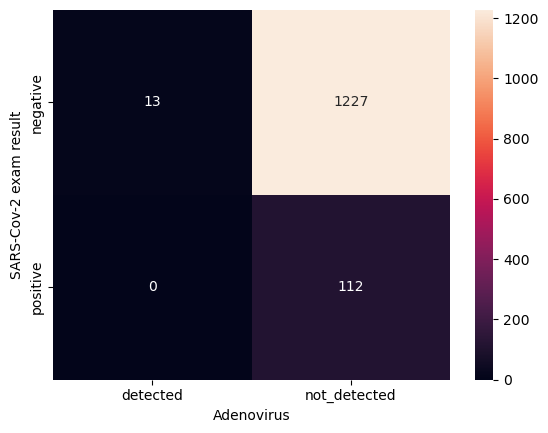

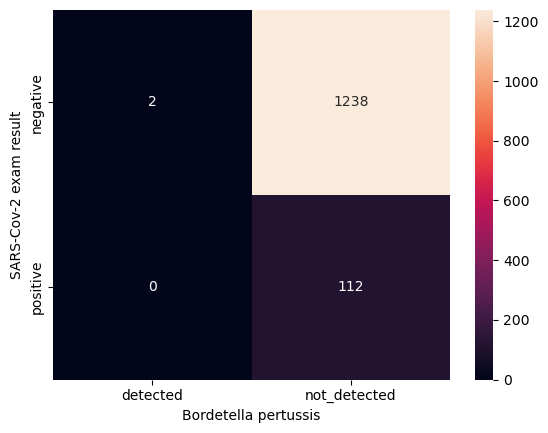

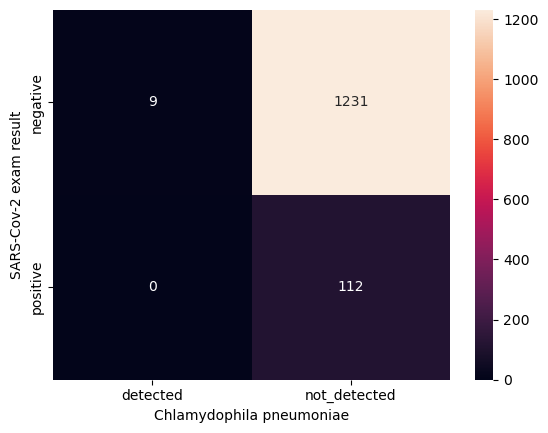

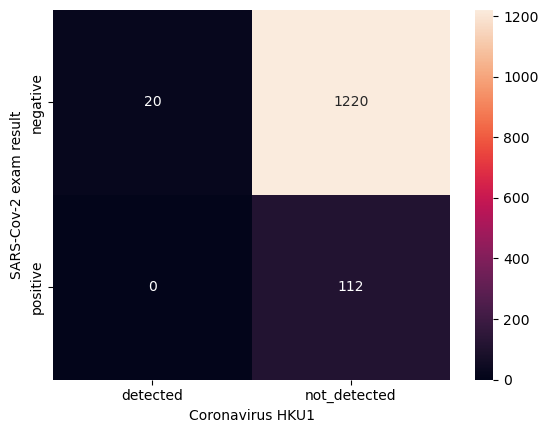

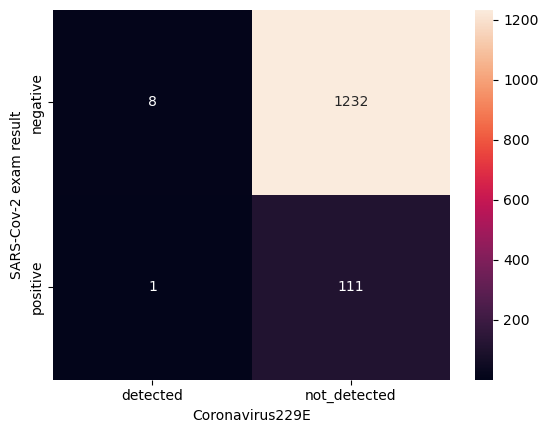

...

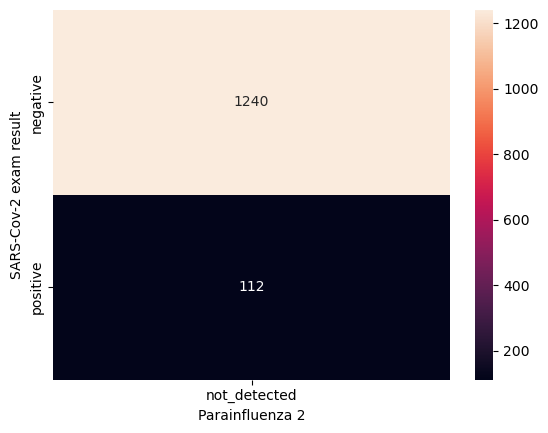

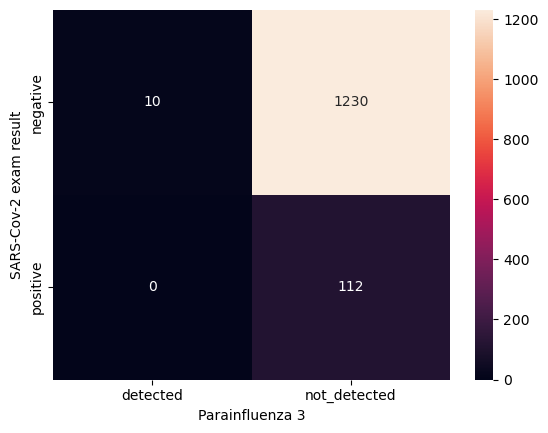

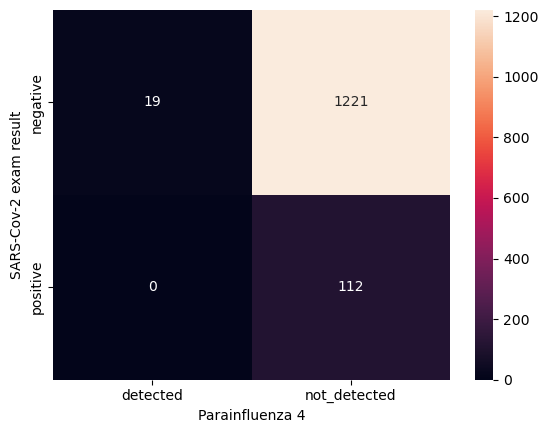

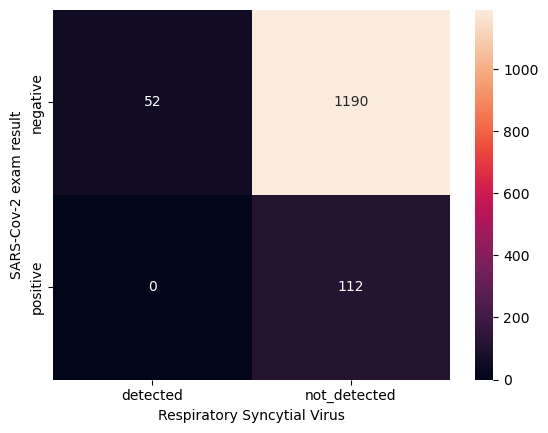

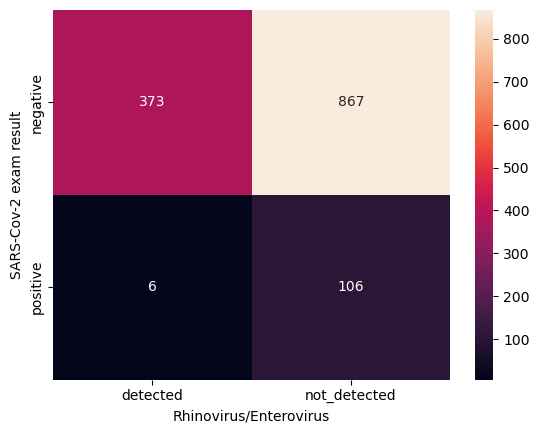

In [103]:
#créer une boucle for qui itère sur chaque colonne (col) dans viral_columns
for col in viral_columns:
    #créer une figure
    plt.figure()
    
    #afficher les tableaux croisés, des relations entre 'SARS-Cov-2 exam result' et les variables de viral_columns, avec seaborn
    #df['SARS-Cov-2 exam result']: la colonne SARScov de df
    #df[col]: les colonnes (variables) de viral_columns dans df
    #annot=True: True signifie afficher les valeurs dans chaque cellule
    #fmt='d': afficher les nombres en entier
    sns.heatmap(pd.crosstab(df['SARS-Cov-2 exam result'], df[col]), annot=True, fmt='d')

In [104]:
'''
Pour la relation target/viral on voit pour chaque variable de viral:

- la plupart des cas sont ceux qui ne portent aucun virus (résultat de test négatif pour les 2 variables)
- le 2ème cas dans la liste sont les individus qui ont un test positif de SARScov et négatif pour le 2ème virus
- le 3ème cas, qui est rare, sont les individus qui ont:
   - un test négatif de SARScov et positif pour le 2ème virus
   - un test positif de SARScov et positif pour le 2ème virus, donc portent les 2 virus (très rare)

- cas particlier:
 - un nombre élevé de cas qui ont un test négatif de SARScov et positif pour Rhinovirus/Enterovirus
 - la variable Parainfluenza 2 n'a qu'une seule valeur unique. Donc c'est une variable inutile (à éliminer après)

Donc peut être que:
Rhinovirus/Enterovirus positif => covid-19 négatif. C'est une hypothèse à tester. (Mais pas à ce stade de développement)
Mais il est possible que la région ait subie une épidémie de ce virus.
De plus on peut très bien avoir 2 virus en même temps.
Il est possible que tout ça n'ait aucun lien avec le covid-19.
'''

"\nPour la relation target/viral on voit pour chaque variable de viral:\n\n- la plupart des cas sont ceux qui ne portent aucun virus (résultat de test négatif pour les 2 variables)\n- le 2ème cas dans la liste sont les individus qui ont un test positif de SARScov et négatif pour le 2ème virus\n- le 3ème cas, qui est rare, sont les individus qui ont:\n   - un test négatif de SARScov et positif pour le 2ème virus\n   - un test positif de SARScov et positif pour le 2ème virus, donc portent les 2 virus (très rare)\n\n- cas particlier:\n - un nombre élevé de cas qui ont un test négatif de SARScov et positif pour Rhinovirus/Enterovirus\n - la variable Parainfluenza 2 n'a qu'une seule valeur unique. Donc c'est une variable inutile (à éliminer après)\n\nDonc peut être que:\nRhinovirus/Enterovirus positif => covid-19 négatif. C'est une hypothèse à tester. (Mais pas à ce stade de développement)\nMais il est possible que la région ait subie une épidémie de ce virus.\nDe plus on peut très bien avo

## Analyse plus détaillée

### Relation Variables / Variables

#### Relations entre les variables Blood (du bilan hématologique)

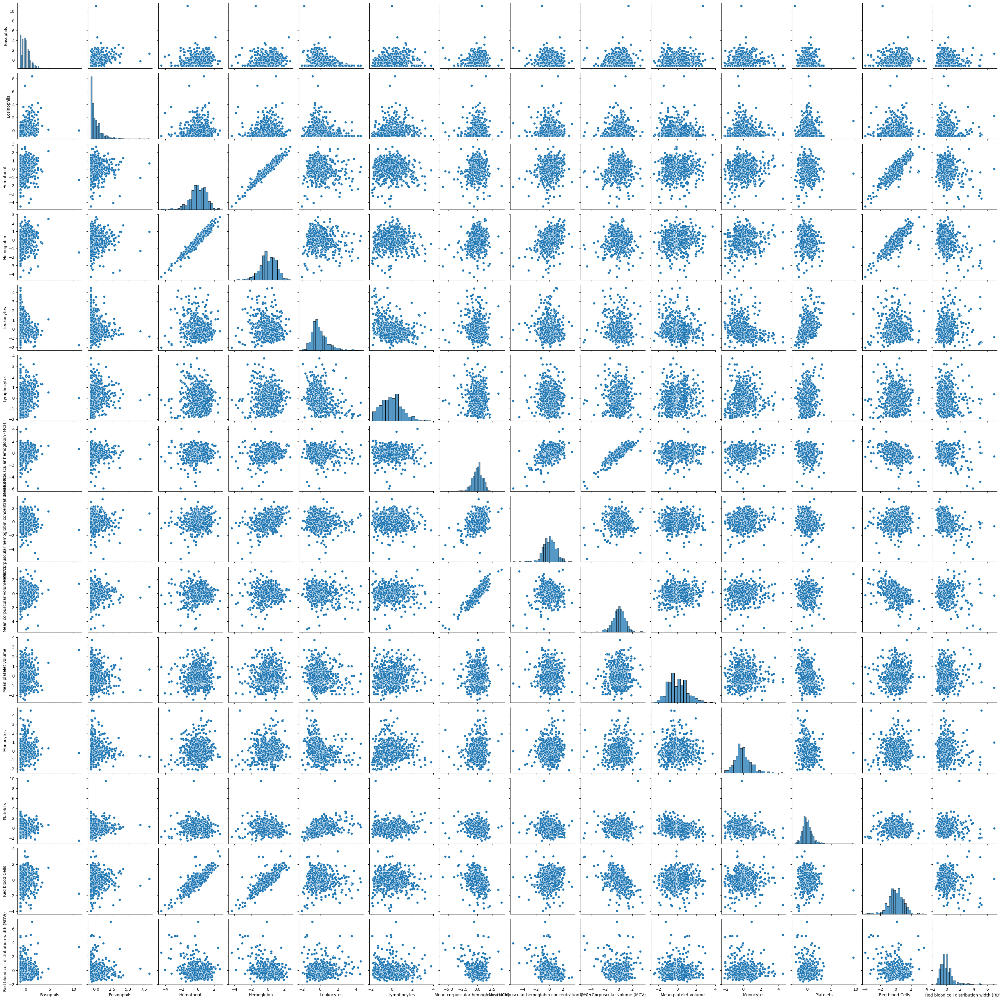

In [107]:
#afficher les relations entre les éléments de blood_columns de df avec seaborn.pairplot
sns.pairplot(df[blood_columns])

In [108]:
'''
On observe qu'il y a des relations linéaires entre certaines variables. exp: la relation entre hematocrit et hemoglobin.

On peut utiliser heatmap pour faciliter ces observations: (astuce à retenir)
ça donne non seulement le même résultat que celui-ci, mais en plus de ça on peut voir les corrélations entre les différentes variables!
'''

"\nOn observe qu'il y a des relations linéaires entre certaines variables. exp: la relation entre hematocrit et hemoglobin.\n\nOn peut utiliser heatmap pour faciliter ces observations: (astuce à retenir)\nça donne non seulement le même résultat que celui-ci, mais en plus de ça on peut voir les corrélations entre les différentes variables!\n"

<Axes: >

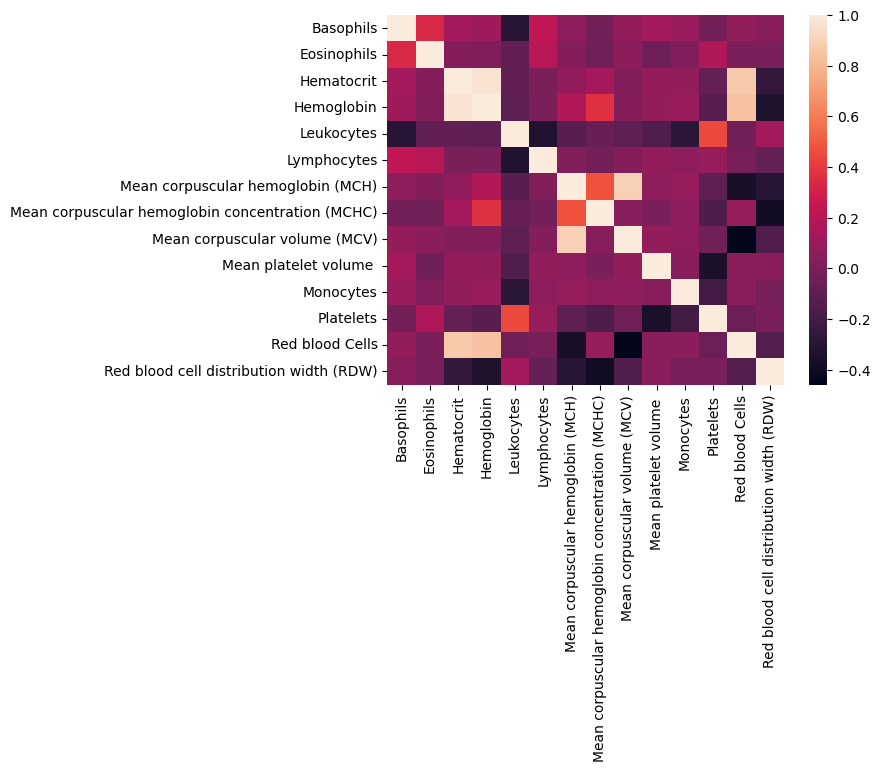

In [109]:
#afficher la heatmap pour faciliter l'observation des corrélations (donc des relations) entre les variables de blood_columns

#df[blood_columns].corr(): donne les corrélations entre les différentes variables de blood_columns dans df
#sns.heatmap(): affiche la heatmap
sns.heatmap(df[blood_columns].corr())

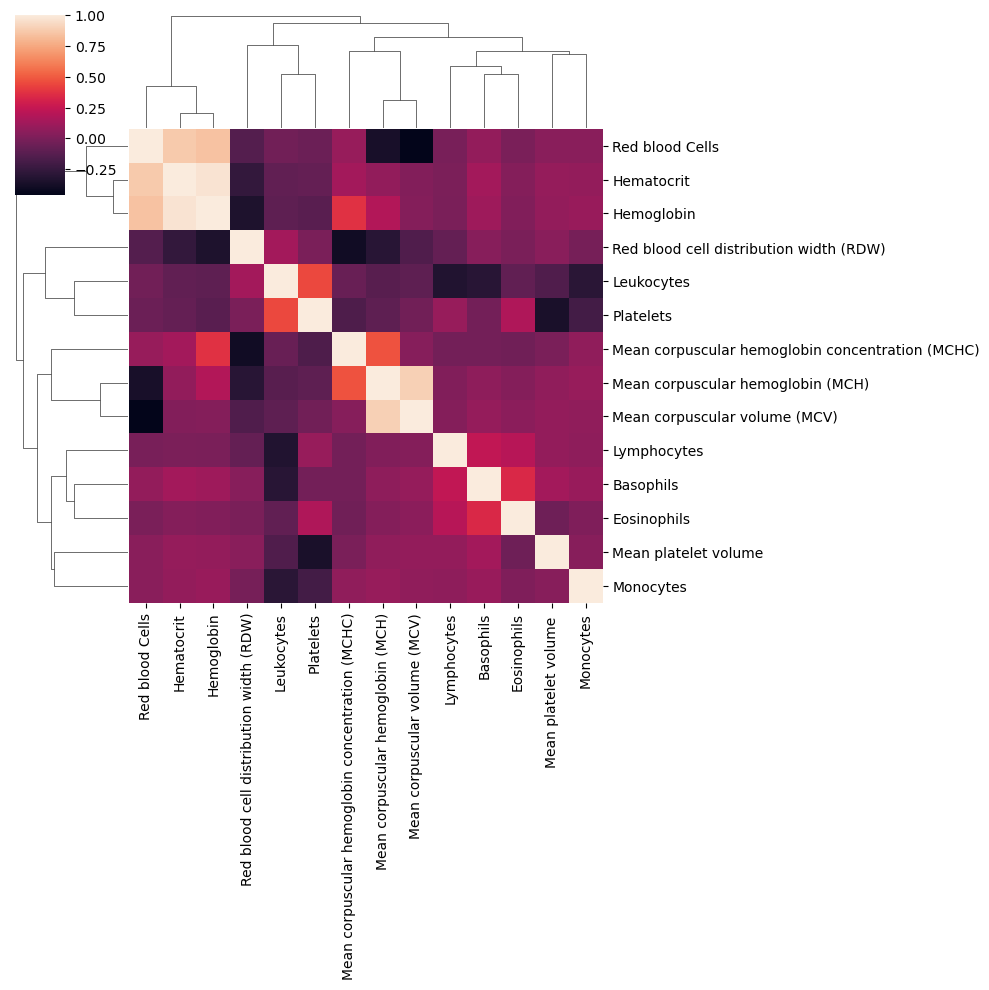

In [110]:
#Clustermap est comme heatmap mais elle rassemble les variables qui ont de fortes corrélations en des clusters

#df[blood_columns].corr(): donne les corrélations entre les différentes variables de blood_columns dans df
#sns.clustermap(): affiche la clustermap
sns.clustermap(df[blood_columns].corr())

In [111]:
'''
Les variables qui ont de fortes corrélations:

1)
- Red blood cells avec hematocrit
- Red blood cells avec hemoglobin
- Hematocrit avec hemoglobin

2)
-MCH avec MCV


Remarque:
On ne sait pas encore à quoi ça va servir à ce stade, mais il est très très important d'avoir ce graphique,
ce sont des informations très utiles pour prendre des décisions après, lors de la modélisation.
'''

"\nLes variables qui ont de fortes corrélations:\n\n1)\n- Red blood cells avec hematocrit\n- Red blood cells avec hemoglobin\n- Hematocrit avec hemoglobin\n\n2)\n-MCH avec MCV\n\n\nRemarque:\nOn ne sait pas encore à quoi ça va servir à ce stade, mais il est très très important d'avoir ce graphique,\nce sont des informations très utiles pour prendre des décisions après, lors de la modélisation.\n"

#### Relation age / Blood (du bilan hématologique)

C:\Users\HP\AppData\Local\Temp\ipykernel_6444\398215632.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 640x480 with 0 Axes>

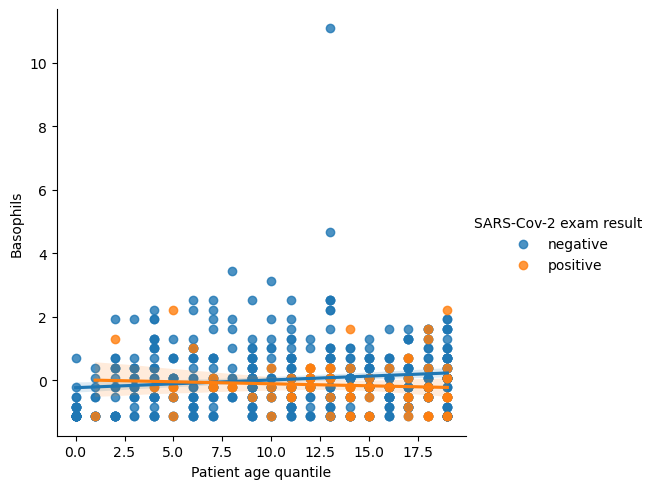

<Figure size 640x480 with 0 Axes>

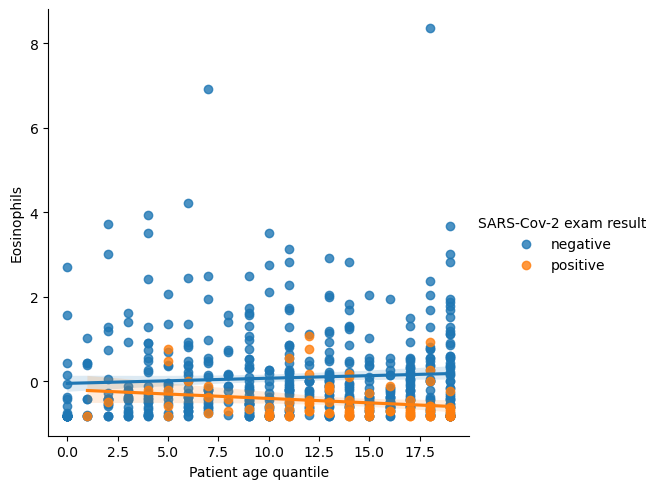

<Figure size 640x480 with 0 Axes>

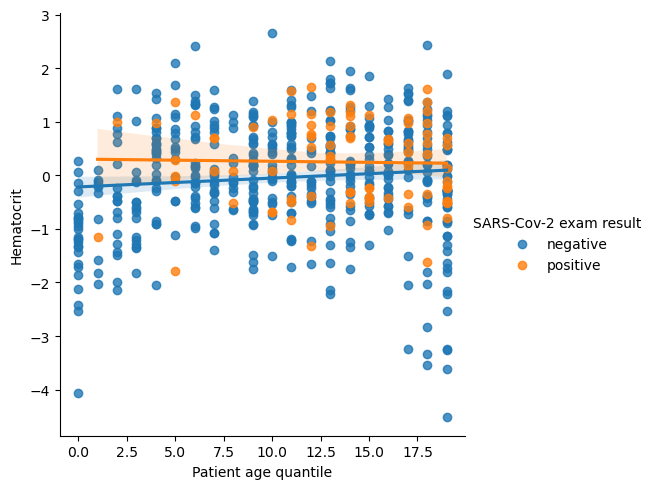

<Figure size 640x480 with 0 Axes>

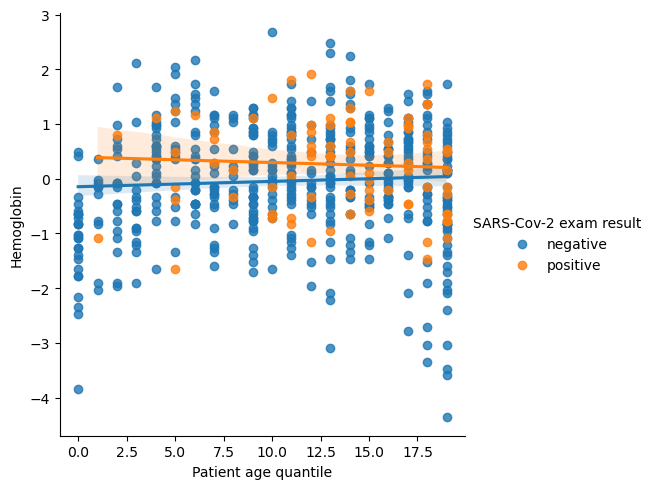

<Figure size 640x480 with 0 Axes>

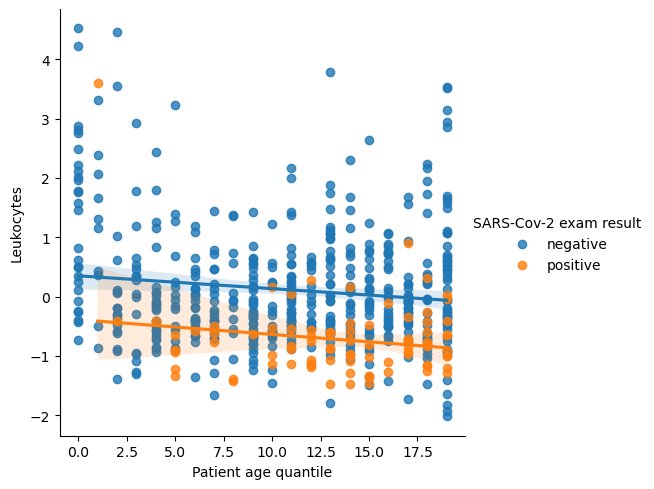

<Figure size 640x480 with 0 Axes>

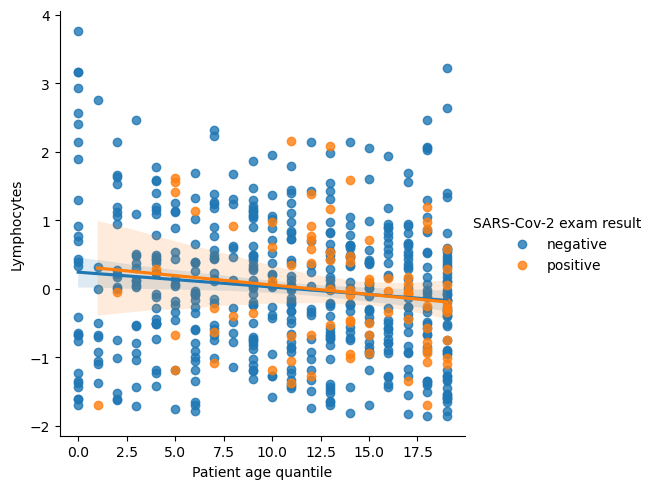

<Figure size 640x480 with 0 Axes>

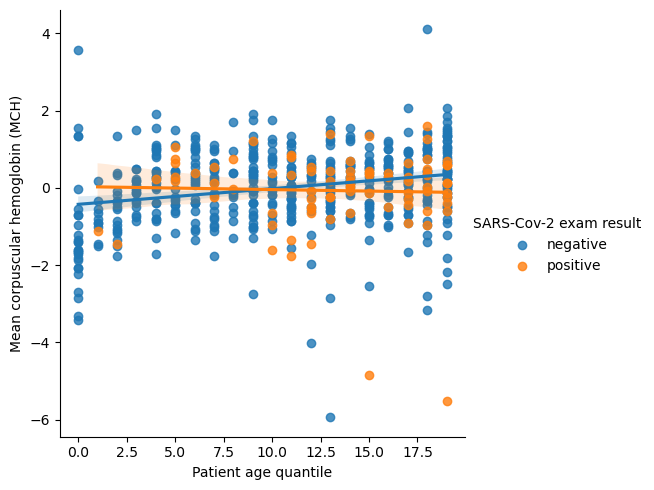

<Figure size 640x480 with 0 Axes>

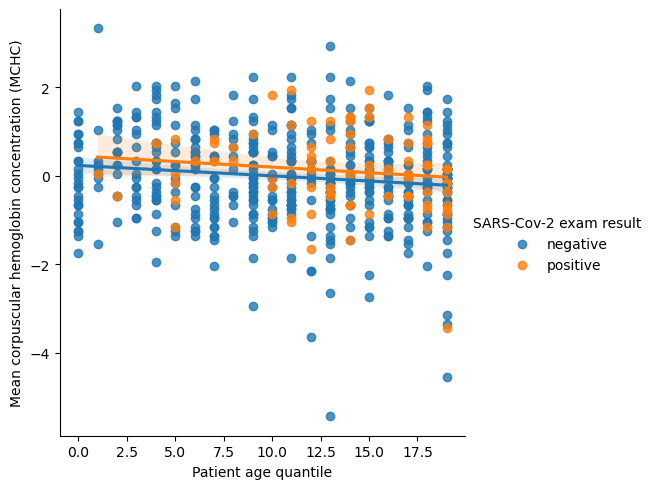

<Figure size 640x480 with 0 Axes>

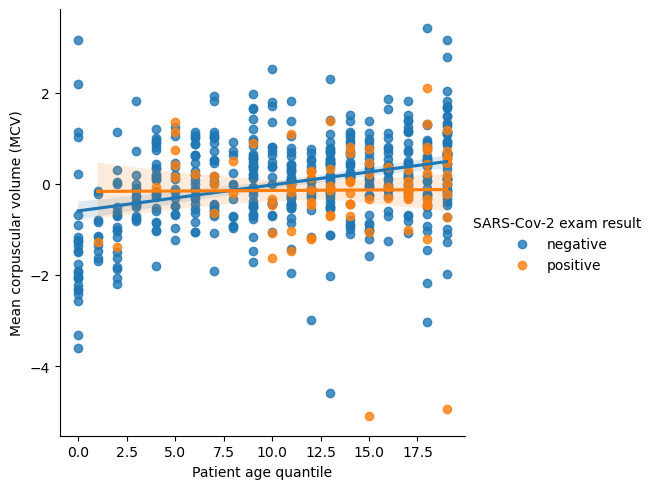

<Figure size 640x480 with 0 Axes>

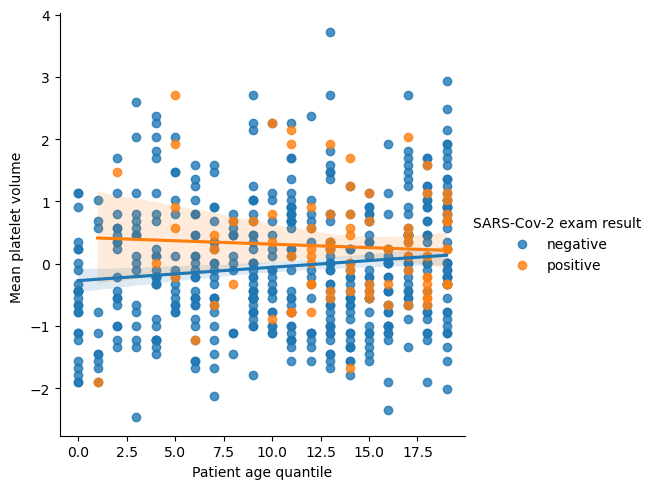

<Figure size 640x480 with 0 Axes>

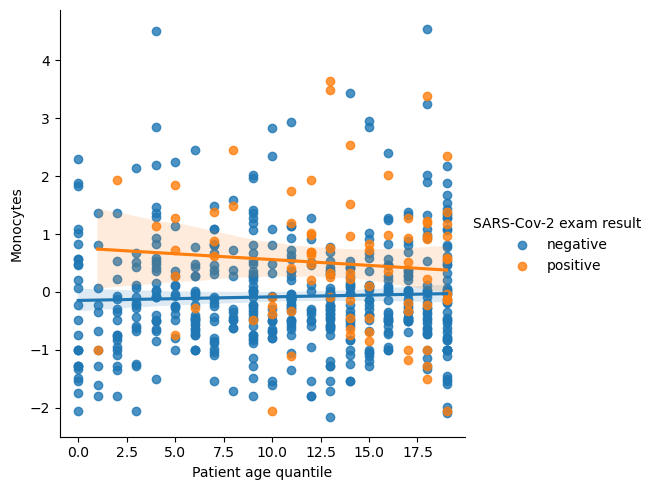

<Figure size 640x480 with 0 Axes>

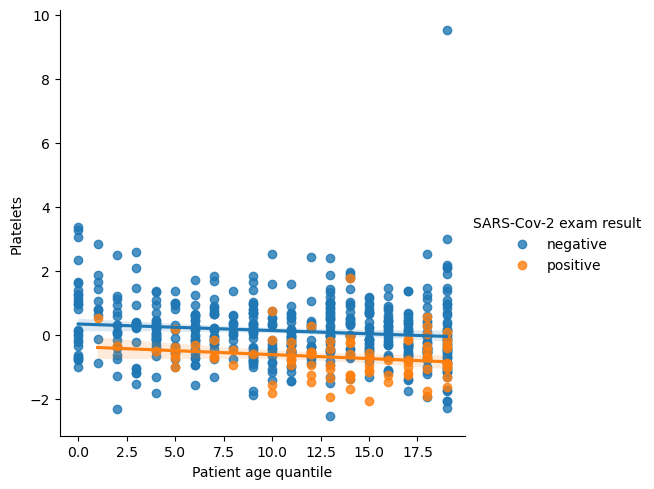

<Figure size 640x480 with 0 Axes>

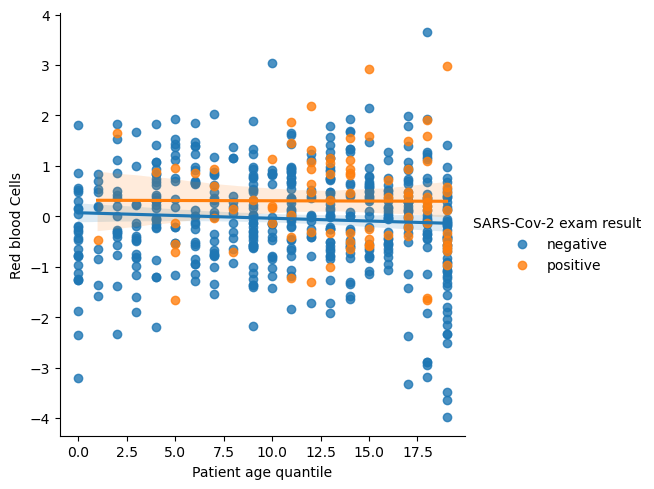

<Figure size 640x480 with 0 Axes>

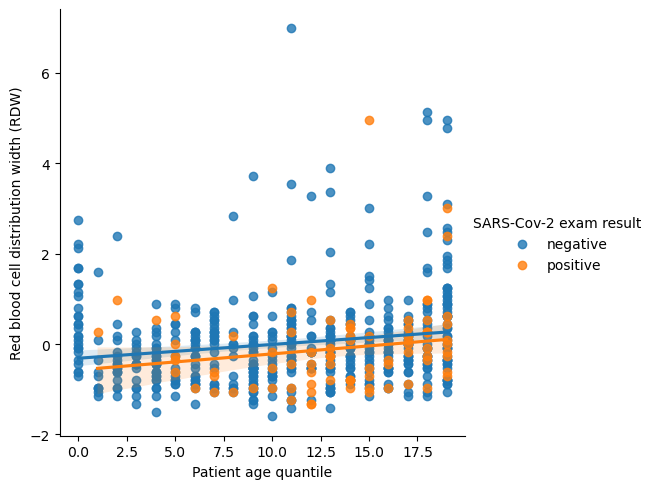

In [113]:
#boucle for qui itère sur chaque variable (col) de blood_columns
for col in blood_columns:
    #créer une figure
    plt.figure()
    #afficher les graphiques avec sns.lmplot qui visualise les courbes de régression dans les nuage de points
    #x='Patient age quantile': Patient age quantile dans l'axe des abscisses
    #y=col: chaque variable de blood_columns dans l'axe des ordonnées
    #hue='SARS-Cov-2 exam result': distinguer la différence selon les catégories de SARS-Cov-2 exam result
    #data=df: les données utilisées (ici df)
    sns.lmplot(x='Patient age quantile', y=col, hue='SARS-Cov-2 exam result', data=df)

In [114]:
'''
Pour faciliter l'interprétation de ces résultats,
on utilise la matrice de corrélation entre Patient age quantile et les autres variables numériques de df (dont blood_columns)
'''

"\nPour faciliter l'interprétation de ces résultats,\non utilise la matrice de corrélation entre Patient age quantile et les autres variables numériques de df (dont blood_columns)\n"

In [115]:
#afficher la matrice de corrélation entre les différentes variables numériques de df

#df.corr(): affiche les corrélations entre les différentes variables de df
#numeric_only=True: sélectionne les valeurs numériques (int et float) seulement
df.corr(numeric_only=True)

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW)
Patient age quantile,1.000000,0.046166,0.015736,-0.035772,0.096808,0.060320,-0.158683,0.119449,-0.037510,-0.125935,-0.124671,-0.166386,0.107525,0.197394,0.022085,0.281655,0.050962,0.166429
"Patient addmited to regular ward (1=yes, 0=no)",0.046166,1.000000,-0.011264,-0.010192,-0.087241,-0.091867,-0.183091,-0.013134,-0.053143,-0.095313,-0.034642,-0.103005,0.031833,-0.050703,-0.085636,-0.039326,-0.000354,0.102160
"Patient addmited to semi-intensive unit (1=yes, 0=no)",0.015736,-0.011264,1.000000,-0.008087,-0.182215,-0.177142,0.006966,-0.023475,-0.137951,-0.110574,-0.023390,0.138304,-0.132984,-0.054479,-0.089780,-0.050871,-0.037916,0.092406
"Patient addmited to intensive care unit (1=yes, 0=no)",-0.035772,-0.010192,-0.008087,1.000000,-0.183850,-0.178878,0.125953,-0.073511,-0.120659,-0.109867,-0.036227,0.271681,-0.121429,-0.090487,-0.088586,-0.078215,-0.103629,0.193560
Hematocrit,0.096808,-0.087241,-0.182215,-0.183850,1.000000,0.968447,-0.082296,0.083580,0.872987,0.002035,0.130771,-0.089937,0.129268,0.075216,0.029781,0.025161,0.082361,-0.264708
Hemoglobin,0.060320,-0.091867,-0.177142,-0.178878,0.968447,1.000000,-0.120150,0.078816,0.841420,-0.004105,0.371708,-0.102375,0.116389,0.184883,0.018618,0.027679,0.094586,-0.342426
Platelets,-0.158683,-0.183091,0.006966,0.125953,-0.082296,-0.120150,1.000000,-0.356332,-0.054561,0.090607,-0.159397,0.443056,-0.025990,-0.101245,0.169453,-0.033844,-0.200660,-0.008222
Mean platelet volume,0.119449,-0.013134,-0.023475,-0.073511,0.083580,0.078816,-0.356332,1.000000,0.043419,0.079060,-0.004011,-0.154643,0.128630,0.069457,-0.046539,0.078026,0.038380,0.045468
Red blood Cells,-0.037510,-0.053143,-0.137951,-0.120659,0.872987,0.841420,-0.054561,0.043419,1.000000,-0.009843,0.090073,-0.036159,0.079362,-0.367077,-0.004408,-0.458531,0.045172,-0.138071
Lymphocytes,-0.125935,-0.095313,-0.110574,-0.109867,0.002035,-0.004105,0.090607,0.079060,-0.009843,1.000000,-0.027979,-0.330536,0.234675,0.014736,0.199562,0.026927,0.065313,-0.079711


In [116]:
#afficher la matrice de corrélation entre les différentes variables numériques de df et Patient age quantile
#filtrer les résultats précédents avec ['Patient age quantile']

#df.corr(): affiche les corrélations entre les différentes variables de df
#numeric_only=True: sélectionne les valeurs numériques (int et float) seulement
#['Patient age quantile']: seulement pour la variable Patient age quantile
#sort_values(): ordonner les résultats (ordre ascendant par défaut)
df.corr(numeric_only=True)['Patient age quantile'].sort_values()

Leukocytes                                              -0.166386
Platelets                                               -0.158683
Lymphocytes                                             -0.125935
Mean corpuscular hemoglobin concentration (MCHC)        -0.124671
Red blood Cells                                         -0.037510
Patient addmited to intensive care unit (1=yes, 0=no)   -0.035772
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.015736
Eosinophils                                              0.022085
Patient addmited to regular ward (1=yes, 0=no)           0.046166
Monocytes                                                0.050962
Hemoglobin                                               0.060320
Hematocrit                                               0.096808
Basophils                                                0.107525
Mean platelet volume                                     0.119449
Red blood cell distribution width (RDW)                  0.166429
Mean corpu

In [117]:
'''
Les coefficients de corrélation qui sont les plus proches de 1 et de -1:
pour 1: on a 0.281655 qui est très faible
pour -1: on a -0.166386 qui est très faible aussi

Conclusion:
Il n'y a pas vraiment de relation entre une de ces variables et Patient age quantile
'''

"\nLes coefficients de corrélation qui sont les plus proches de 1 et de -1:\npour 1: on a 0.281655 qui est très faible\npour -1: on a -0.166386 qui est très faible aussi\n\nConclusion:\nIl n'y a pas vraiment de relation entre une de ces variables et Patient age quantile\n"

#### Relations entre les variables Viral (des tests de virus)

On trouve étrange la présence des variables:
- 'Influenza A' et'Influenza A, rapid test'
- 'Influenza B' et 'Influenza B, rapid test'

Mais quelle est alors la différence entre ces variables?

**Relation entre Influenza et rapid test:**

On essaye de visualiser la différence en utilisant des tableaux croisés pour chaque pair de variables.

In [121]:
#tableau croisé pour comparer les variables Influenza A et Influenza A, rapid test
pd.crosstab(df['Influenza A'], df['Influenza A, rapid test'])

"Influenza A, rapid test",negative,positive
Influenza A,,
detected,2,4
not_detected,245,15


In [122]:
#tableau croisé pour comparer les variables Influenza B et Influenza B, rapid test
pd.crosstab(df['Influenza B'], df['Influenza B, rapid test'])

"Influenza B, rapid test",negative,positive
Influenza B,,
detected,18,11
not_detected,233,4


In [123]:
'''
par exemple on a:
15 cas positifs de Influenza A, rapid test alors qu'ils sont négatifs pour Influenza A

Remarque 2:
Quand on effectue une recherche sur internet on voit que ces tests rapides sont très peu fiables.
donc influenza rapid test donne de mauvais résultats, il fauda peut-être la laisser tomber.
'''

"\npar exemple on a:\n15 cas positifs de Influenza A, rapid test alors qu'ils sont négatifs pour Influenza A\n\nRemarque 2:\nQuand on effectue une recherche sur internet on voit que ces tests rapides sont très peu fiables.\ndonc influenza rapid test donne de mauvais résultats, il fauda peut-être la laisser tomber.\n"

#### Relations Viral/Blood

- **Création d'une nouvelle variable "is sick" (= "est malade")**

In [126]:
#vérifier les différentes catégories qui résident dans chaque variable de viral_columns

#boucle for sur toutes les colonnes de viral_columns
for col in viral_columns:  
    #imprimer le nom de la colonne (col) suivi des valeurs uniques dans cette colonne
    #df[col].unique(): retourne un tableau avec toutes les valeurs distinctes présentes dans la colonne (col)
    # le format de sortie utilise ':-<' pour aligner le texte à gauche avec des tirets jusqu'à 70 caractères
    #pour faciliter la lecture
    print(f'{col :-<70} {df[col].unique()}')

Adenovirus------------------------------------------------------------ [nan 'not_detected' 'detected']
Bordetella pertussis-------------------------------------------------- [nan 'not_detected' 'detected']
Chlamydophila pneumoniae---------------------------------------------- [nan 'not_detected' 'detected']
Coronavirus HKU1------------------------------------------------------ [nan 'not_detected' 'detected']
Coronavirus229E------------------------------------------------------- [nan 'not_detected' 'detected']
CoronavirusNL63------------------------------------------------------- [nan 'not_detected' 'detected']
CoronavirusOC43------------------------------------------------------- [nan 'not_detected' 'detected']
Inf A H1N1 2009------------------------------------------------------- [nan 'not_detected' 'detected']
Influenza A----------------------------------------------------------- [nan 'not_detected' 'detected']
Influenza A, rapid test----------------------------------------------- [n

In [127]:
'''
On remarque que presque toutes les variables de viral_columns ont 2 catégories: 'detected' et 'not_detected',
à l'exception de 2 variables, 'Influenza A, rapid test' et 'Influenza B, rapid test' qui ont: 'negative' et 'positive',
on se débarasse de ces deux variables:
'''

"\nOn remarque que presque toutes les variables de viral_columns ont 2 catégories: 'detected' et 'not_detected',\nà l'exception de 2 variables, 'Influenza A, rapid test' et 'Influenza B, rapid test' qui ont: 'negative' et 'positive',\non se débarasse de ces deux variables:\n"

In [128]:
#éliminer 'Influenza A, rapid test' et 'Influenza B, rapid test' de viral_columns
viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))

#créer un masque boolean des valeurs 'detected'
df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))] == 'detected'

,Adenovirus,Bordetella pertussis,Chlamydophila pneumoniae,Coronavirus HKU1,Coronavirus229E,CoronavirusNL63,CoronavirusOC43,Inf A H1N1 2009,Influenza A,Influenza B,Metapneumovirus,Parainfluenza 1,Parainfluenza 2,Parainfluenza 3,Parainfluenza 4,Respiratory Syncytial Virus,Rhinovirus/Enterovirus
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5640,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5641,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5642,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [129]:
#faire la somme de ce tableau numpy selon axis=1 (la somme des colonnes)
np.sum(df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))] == 'detected', axis=1)

0       0
1       1
2       0
3       0
4       1
       ..
5639    0
5640    0
5641    0
5642    0
5643    0
Length: 5644, dtype: int64

In [130]:
'''
Ce tableau indique si une personne a un, ou plusieurs, test(s) positif(s)
On peut même visualiser avec matplotlib pour voir ce tableau
'''

'\nCe tableau indique si une personne a un, ou plusieurs, test(s) positif(s)\nOn peut même visualiser avec matplotlib pour voir ce tableau\n'

<Axes: >

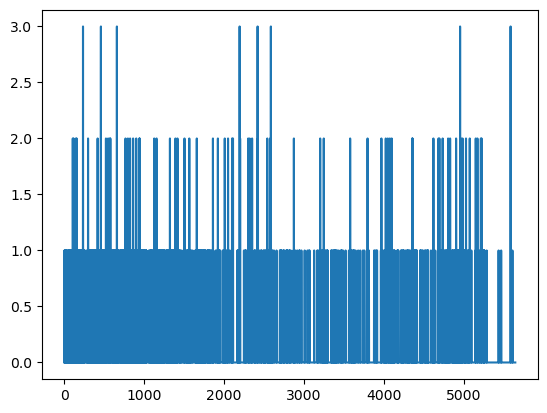

In [131]:
#visualiser avec matplotlib le tableau précédent
np.sum(df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))] == 'detected', axis=1).plot()

In [132]:
'''
On voit ici qu'il y a même des patients avec 3 tests positifs à la fois.
'''

"\nOn voit ici qu'il y a même des patients avec 3 tests positifs à la fois.\n"

In [133]:
#créer un maque boolean pour les valeurs >= 1
#càd que le patient est testé positif
np.sum(df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))] == 'detected', axis=1) >= 1

0       False
1        True
2       False
3       False
4        True
        ...  
5639    False
5640    False
5641    False
5642    False
5643    False
Length: 5644, dtype: bool

In [134]:
#création de la nouvelle variable 'is sick' dans df

#enregistrer les résultats dans la variable df['is_sick']
df['is_sick'] = np.sum(df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))] == 'detected', axis=1) >= 1

#afficher les 5 premières lignes de df pour vérifier
df.head()

,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",is_sick
0,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
1,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True
2,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
3,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
4,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True


- **Relations Viral/Blood** (càd les relations is sick / taux sanguins)

In [136]:
'''
Créer des sous-ensembles 'positive' et 'negative' pour la variable is_sick
'''

"\nCréer des sous-ensembles 'positive' et 'negative' pour la variable is_sick\n"

In [137]:
#définir sick_df, où les patients sont testés positifs pour un ou plusieurs virus
#df['is_sick'] == True: crée un masque où la valeur de df['is_sick'] == True
#df[df['is_sick'] == True]: sélectionne les valeurs qui respectent cette condition
sick_df = df[df['is_sick'] == True]

#créer not_sick_df de la même manière, où les patients sont testés négatifs pour tous les virus
not_sick_df = df[df['is_sick'] == False]

In [138]:
#la forme de sick_df
sick_df.shape

(692, 39)

In [139]:
#il y a alors 692 patients qui sont testés positifs pour 1 ou plusieurs virus

In [140]:
#la forme de not_sick_df
not_sick_df.shape

(4952, 39)

In [141]:
#il y a alors 4952 patients qui sont testés négatifs pour tous les virus

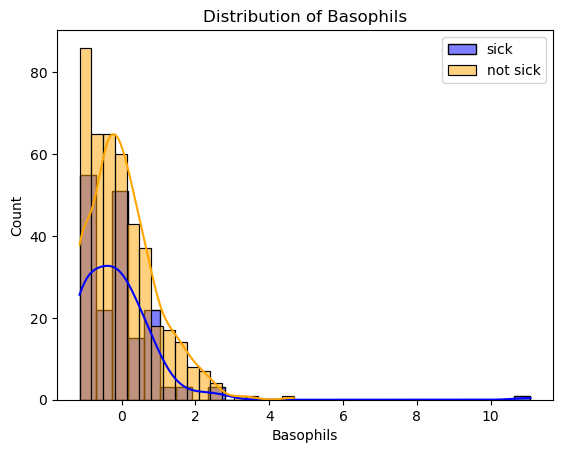

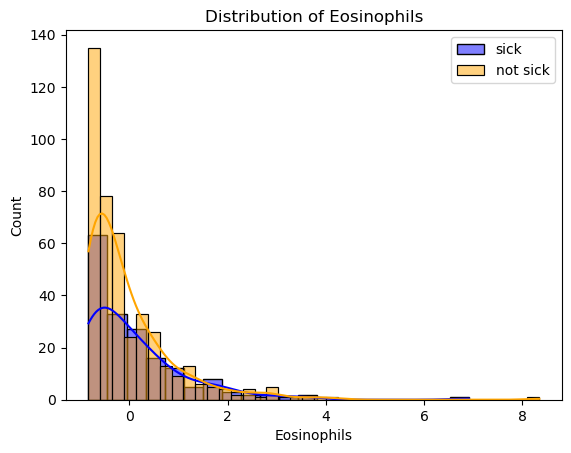

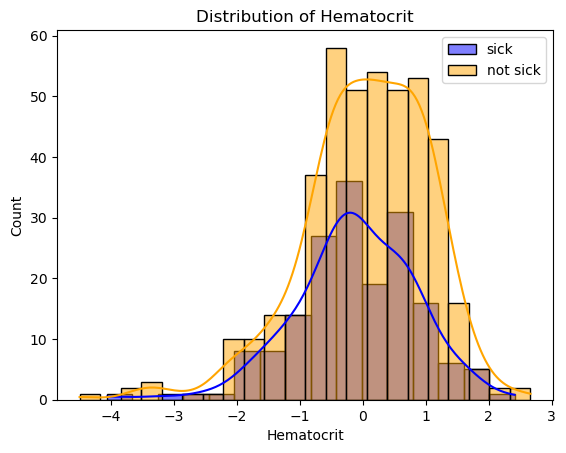

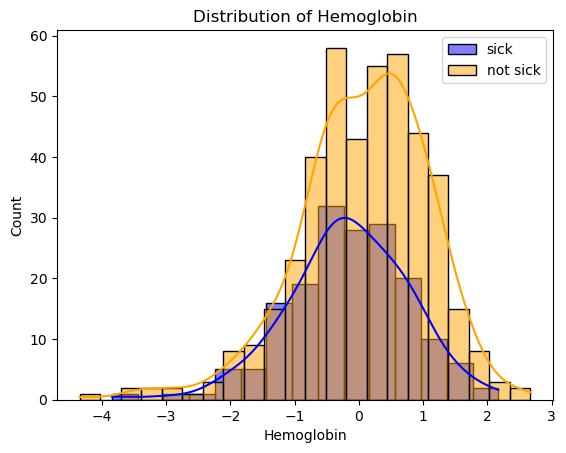

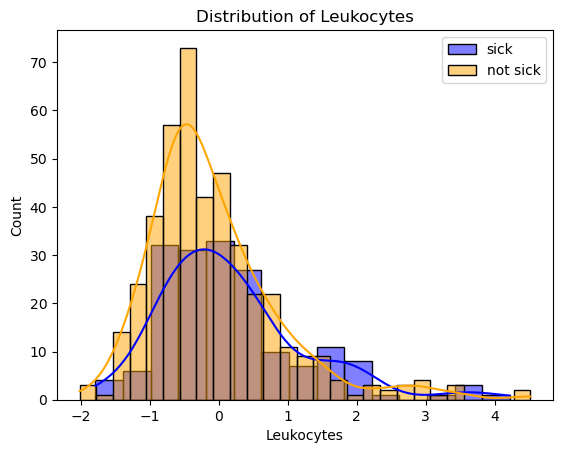

...

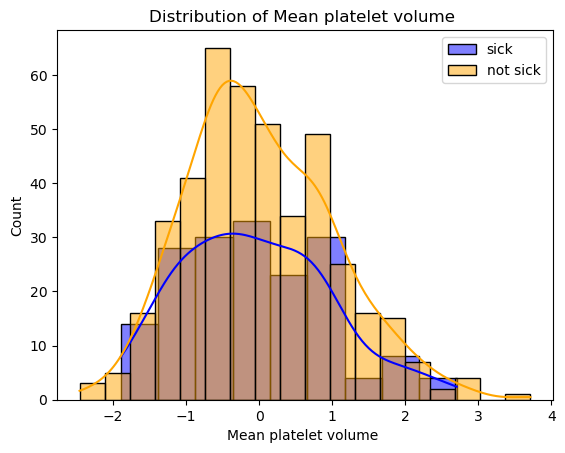

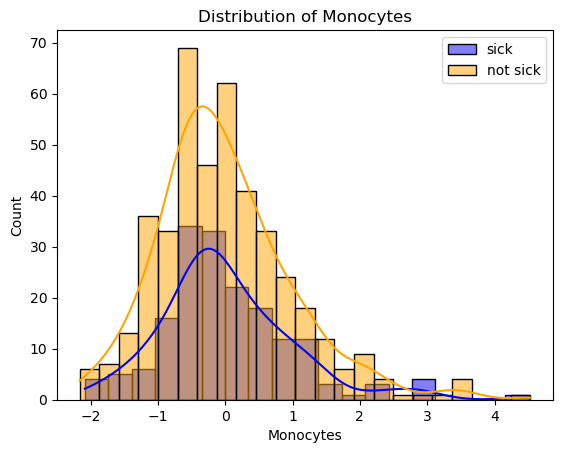

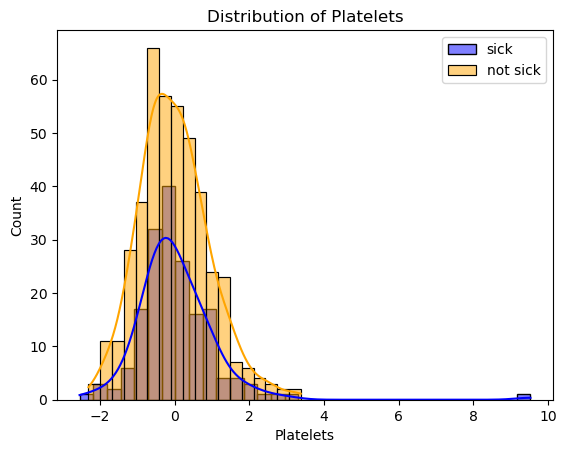

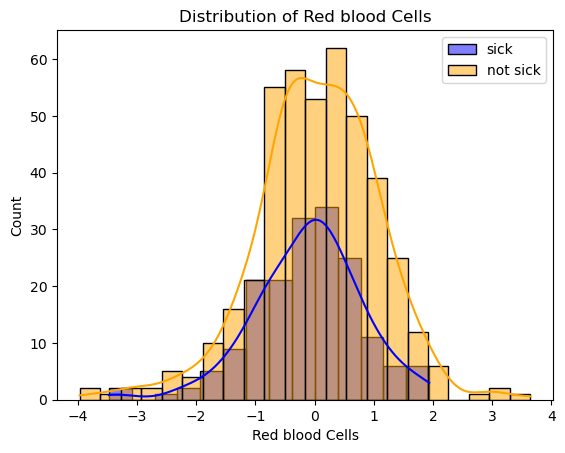

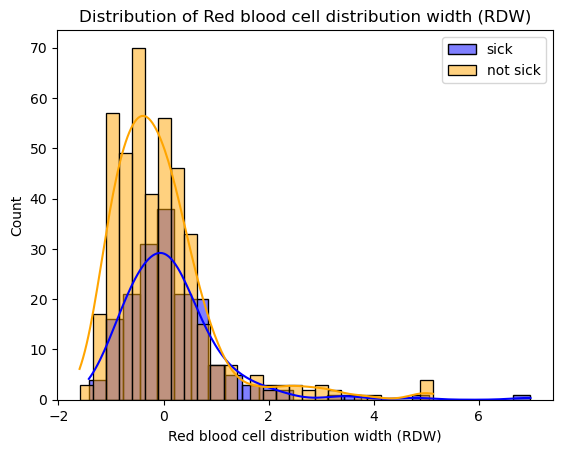

In [142]:
#parcourir chaque colonne spécifiée dans la liste blood_columns
for col in blood_columns:
    #créer une nouvelle figure pour chaque variable
    plt.figure()
    
    #tracer la distribution des valeurs pour chaque colonne de sick_df  
    #label='positive': légender 'positive'  
    sns.histplot(sick_df[col], kde=True, color='Blue', label='sick')
    
    #tracer la distribution des valeurs pour chaque colonne de not_sick_df  
    #label='negative': légender 'negative'  
    sns.histplot(not_sick_df[col], kde=True, color='Orange', label='not sick')
    
    #ajouter une légende pour distinguer les distributions  
    plt.legend()
    
    #ajouter un titre au graphique pour plus de clarté
    plt.title(f'Distribution of {col}')

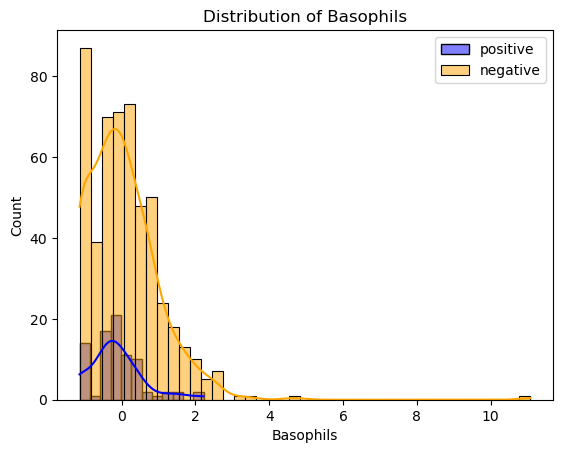

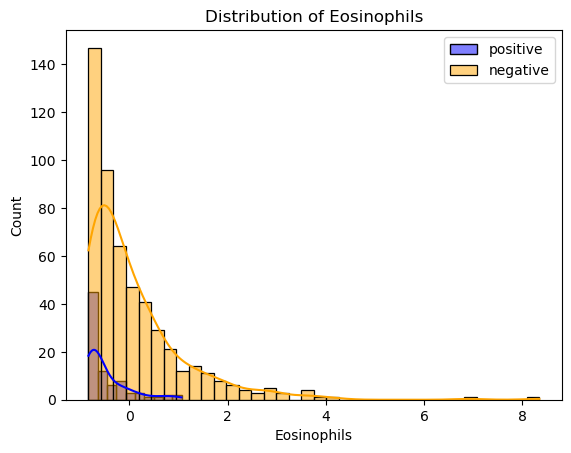

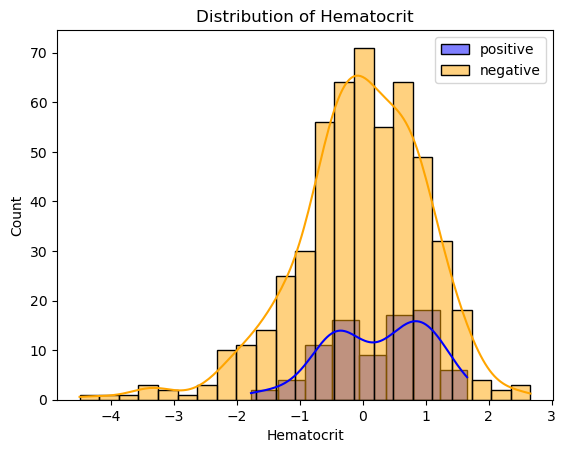

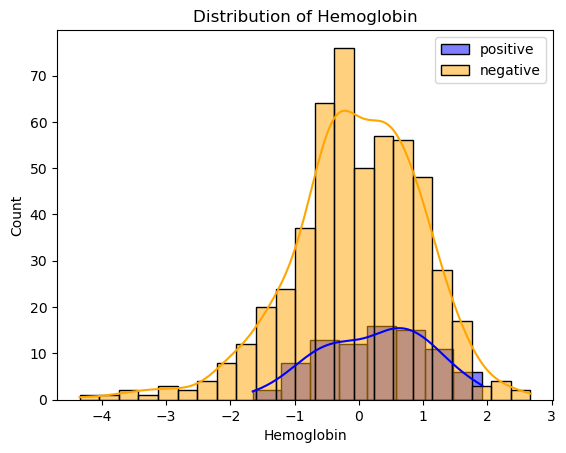

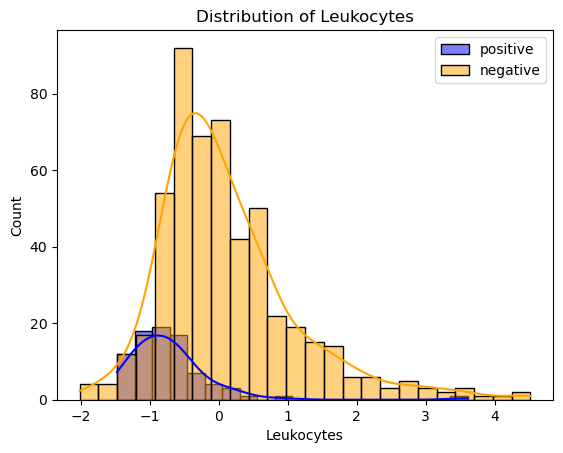

...

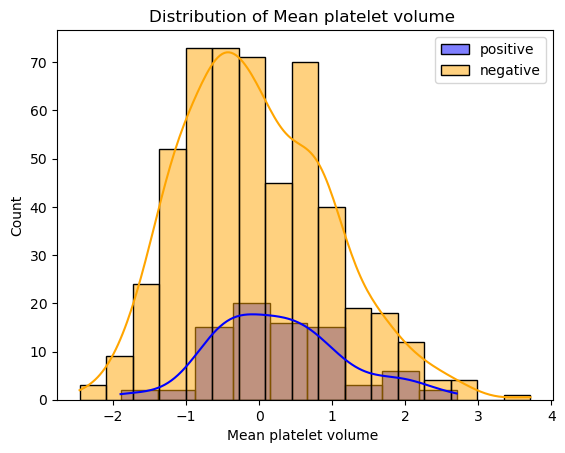

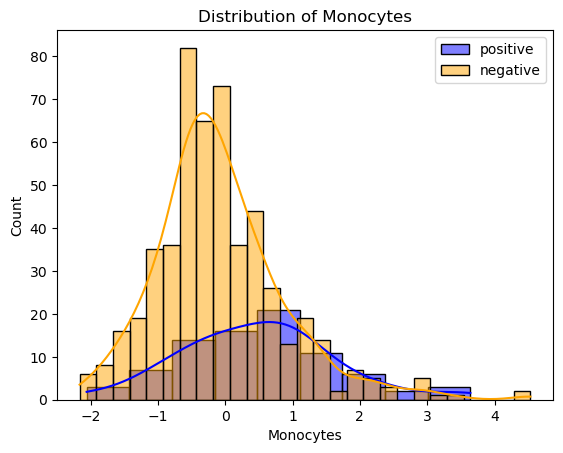

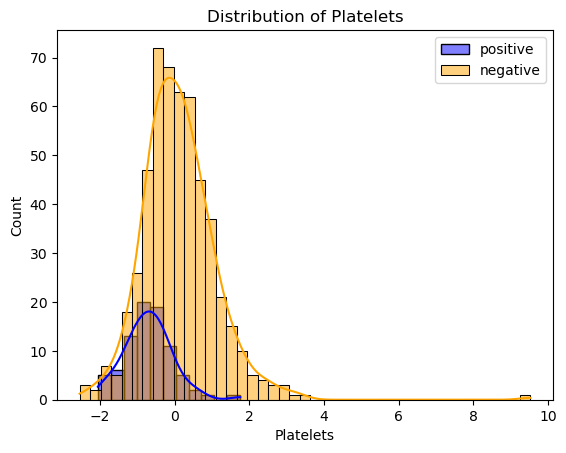

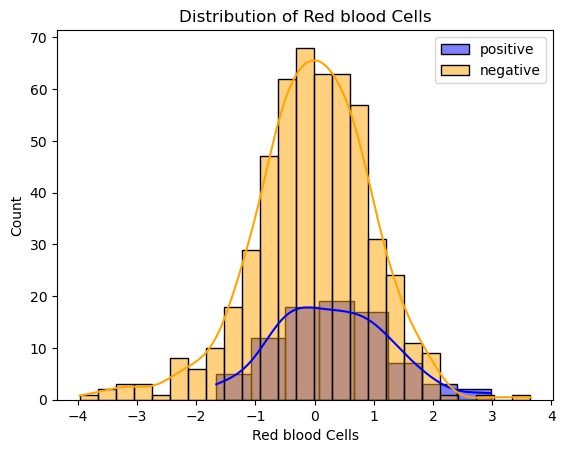

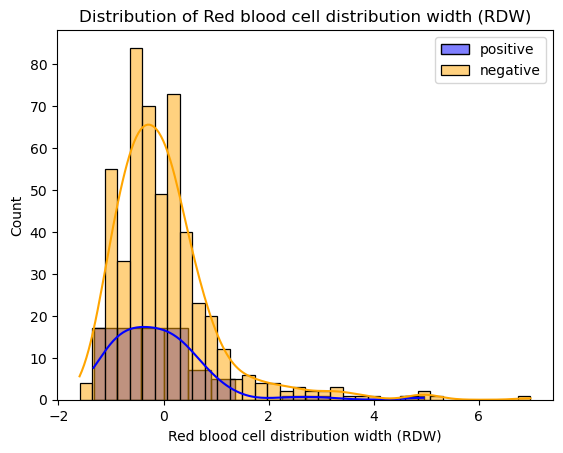

In [143]:
#parcourir chaque colonne spécifiée dans la liste blood_columns  
for col in blood_columns:  
    #créer une nouvelle figure pour chaque variable  
    plt.figure()  
    
    #tracer la distribution des valeurs dans la colonne 'col' pour positive_df  
    #label='positive': légender 'positive'  
    sns.histplot(positive_df[col], kde=True, color='Blue', label='positive')  
    
    #tracer la distribution des valeurs dans la colonne 'col' pour negative_df  
    #label='negative': légender 'negative'  
    sns.histplot(negative_df[col], kde=True, color='Orange', label='negative')
    
    #ajouter une légende pour distinguer les distributions  
    plt.legend()
    
    #ajouter un titre au graphique pour plus de clarté  
    plt.title(f'Distribution of {col}')

In [144]:
'''
En faisant la comparaison entre les graphiques, on voit que:
Les taux sanguins pour les patients testés positifs/négatifs en général (is_sick)
et les taux sanguins pour les patients testés positifs/négatifs pour le covid-19 (SARScov)
sont différents
'''

'\nEn faisant la comparaison entre les graphiques, on voit que:\nLes taux sanguins pour les patients testés positifs/négatifs en général (is_sick)\net les taux sanguins pour les patients testés positifs/négatifs pour le covid-19 (SARScov)\nsont différents\n'

#### relation status / is_sick : (type d'hospitalisation / testé positif ou négatif en général)

- **Création de la variable status:**

In [147]:
#création de la fonction hospitalization

def hospitalization(df):
    #vérifier si le patient est admis dans une unité de soins régulière  
    if df['Patient addmited to regular ward (1=yes, 0=no)'] == 1:  
        return 'regular ward'  # eetourne 'regular ward' si oui
        #vérifie si le patient est admis dans une unité semi-intensive
    elif df['Patient addmited to semi-intensive unit (1=yes, 0=no)'] == 1:
        return 'semi-intensive unit'  #retourne 'semi-intensive unit' si oui
    #vérifie si le patient est admis dans une unité de soins intensifs
    elif df['Patient addmited to intensive care unit (1=yes, 0=no)'] == 1:
        return 'intensive care unit'  #retourne 'intensive care unit' si oui
    else:
        return 'unknown'  #retourne 'unknown' (inocnnu) si aucune condition n'est remplie

In [148]:
#créer une nouvelle colonne 'status' dans df
#Les valeurs de cette colonne seront les résultats de la fonction hospitalization appliquée à chaque ligne de df

#appliquer la fonction 'hospitalisation' à chaque ligne de 'df'  
#'axis=1' indique que l'application se fait ligne par ligne
df['status'] = df.apply(hospitalization, axis=1)

#afficher les 5 prmières lignes de df pour vérifier
df.head()

,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",is_sick,status
0,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
1,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True,unknown
2,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
3,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
4,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True,unknown


- **Relation status / blood**

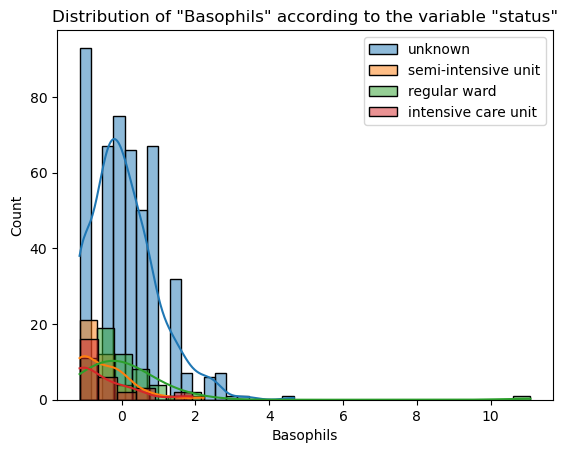

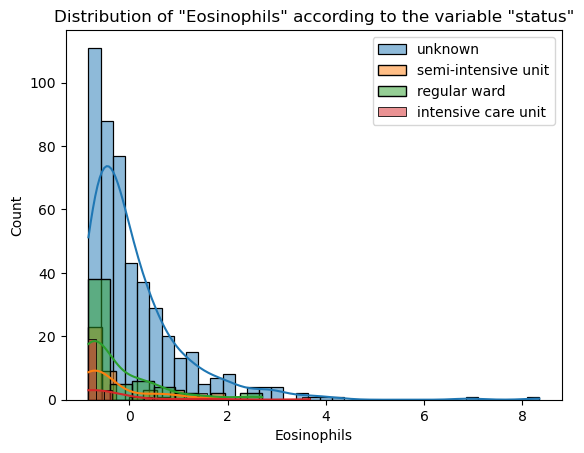

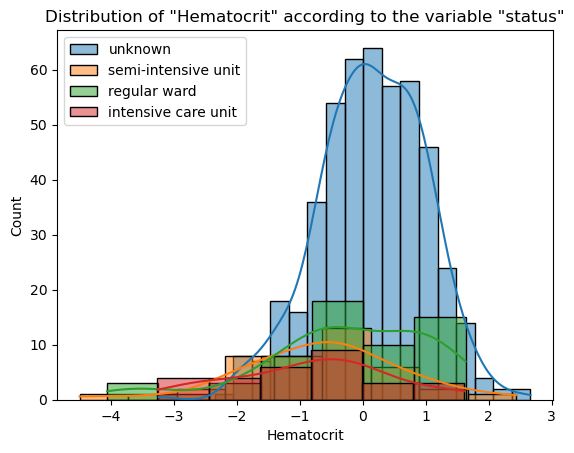

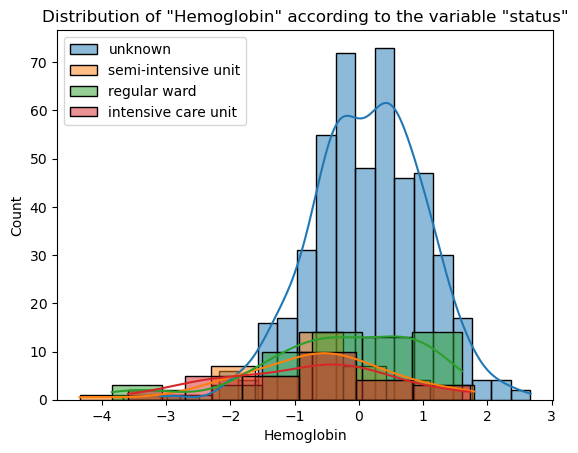

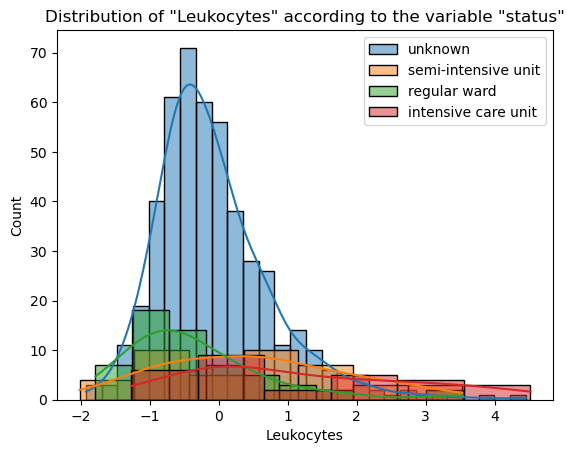

...

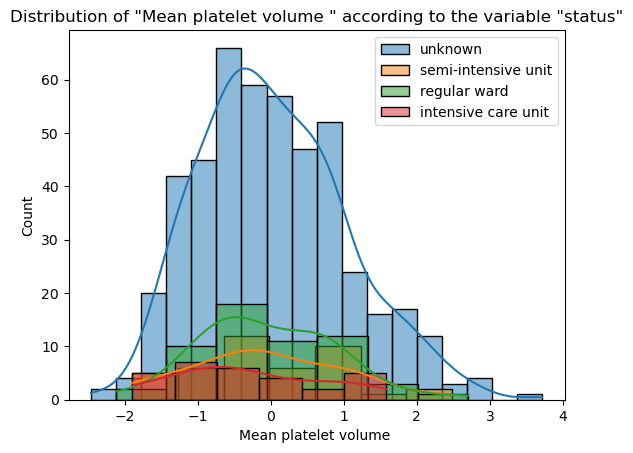

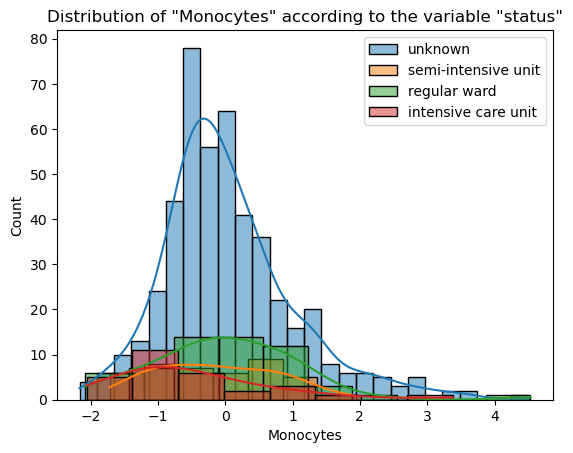

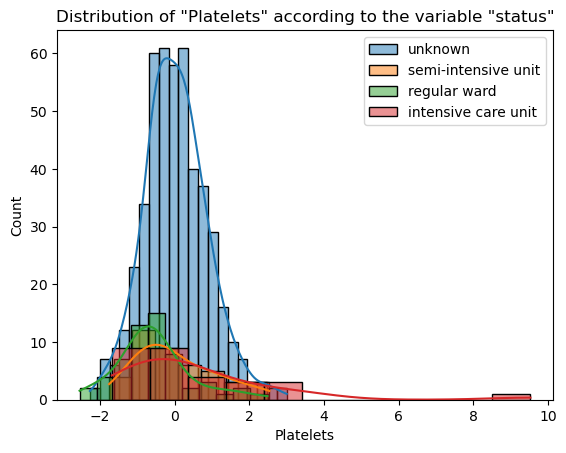

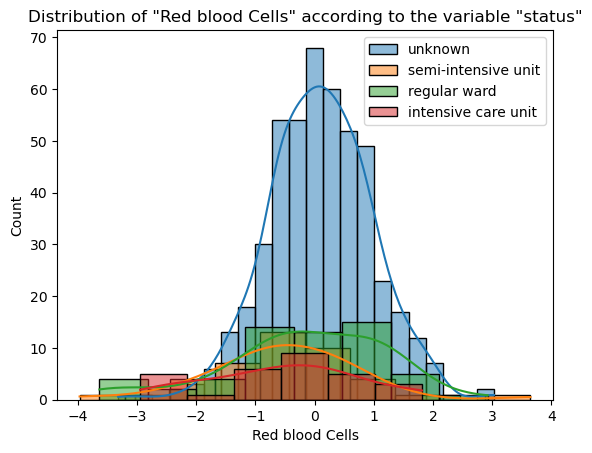

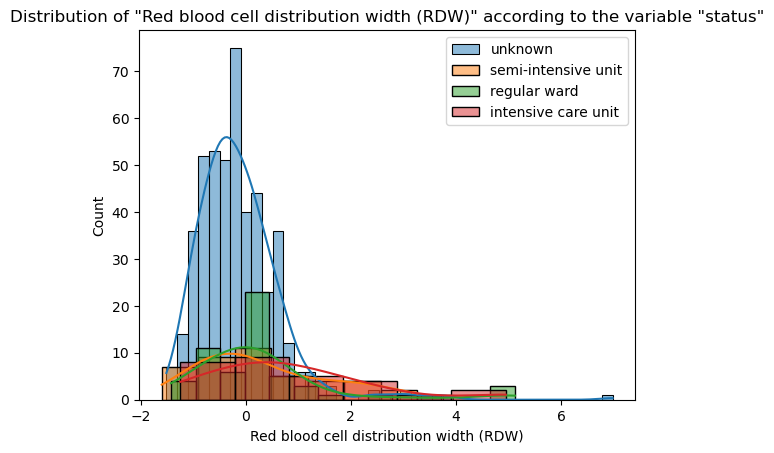

In [150]:
#parcourir chaque colonne spécifiée dans la liste blood_columns  
for col in blood_columns:  
    #créer une nouvelle figure pour chaque variable  
    plt.figure()
    #parcourir chaque catégorie spécifiée dans la colonne status de df
    for cat in df['status'].unique():
        
        #tracer la distribution des valeurs dans la colonne 'col' pour negative_df  
        #label=cat:donne une légende selon la catégorie actuelle de status (cat)
        #df[df['statut']==cat][col]:filtre df pour obtenir uniquement les lignes correspondant à la catégorie actuelle (cat)
        #et sélectionne seulement la colonne d'intérêt (col) de blood_columns
        sns.histplot(df[df['status']==cat][col], kde=True, label=cat)
        
        #ajouter une légende pour distinguer les distributions  
        plt.legend()
    
        #ajouter un titre au graphique pour plus de clarté  
        plt.title(f'Distribution of "{col}" according to the variable "status"')

In [151]:
'''
intéressant dans le cas où on voudrait prédire dans quelle service un patient devrait aller (selon les taux sanguins)
'''

'\nintéressant dans le cas où on voudrait prédire dans quelle service un patient devrait aller (selon les taux sanguins)\n'

### NaN analyse

In [153]:
#afficher blood_columns
blood_columns

Index(['Basophils', 'Eosinophils', 'Hematocrit', 'Hemoglobin', 'Leukocytes',
       'Lymphocytes', 'Mean corpuscular hemoglobin (MCH)',
       'Mean corpuscular hemoglobin concentration (MCHC)',
       'Mean corpuscular volume (MCV)', 'Mean platelet volume ', 'Monocytes',
       'Platelets', 'Red blood Cells',
       'Red blood cell distribution width (RDW)'],
      dtype='object')

In [154]:
#afficher viral_columns
viral_columns

Index(['Adenovirus', 'Bordetella pertussis', 'Chlamydophila pneumoniae',
       'Coronavirus HKU1', 'Coronavirus229E', 'CoronavirusNL63',
       'CoronavirusOC43', 'Inf A H1N1 2009', 'Influenza A',
       'Influenza A, rapid test', 'Influenza B', 'Influenza B, rapid test',
       'Metapneumovirus', 'Parainfluenza 1', 'Parainfluenza 2',
       'Parainfluenza 3', 'Parainfluenza 4', 'Respiratory Syncytial Virus',
       'Rhinovirus/Enterovirus'],
      dtype='object')

<Axes: >

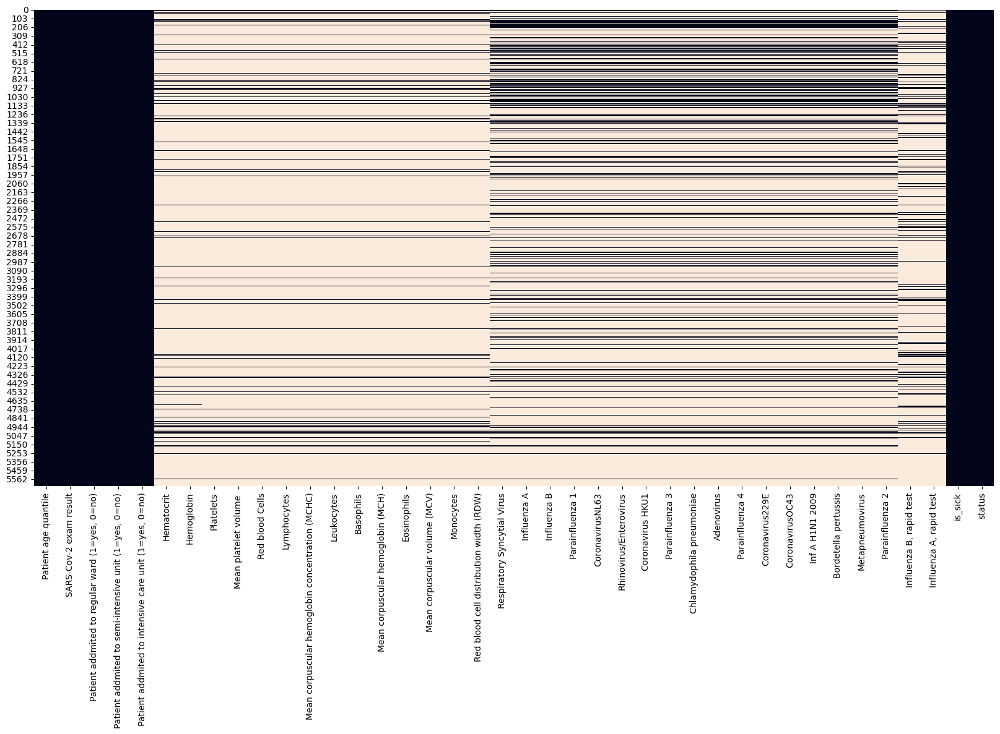

In [155]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [156]:
'''
Ici on voit la heatmap pour afficher les valeurs manquantes de df (on l'a vu au tout début de cette analyse),
on observe qu'il y a une différence entre les colonnes de blood_columns et viral_columns:
les deux groupes ne sont pas alignés

Donc, la réunion entre ces deux groupes (càd supprimer toutes les valeurs manquantes), va éliminer beaucoup trop de valeurs dans le dataset
On va se retrouver avec un nombre trop petit de données
On vérifie quand même:
'''

"\nIci on voit la heatmap pour afficher les valeurs manquantes de df (on l'a vu au tout début de cette analyse),\non observe qu'il y a une différence entre les colonnes de blood_columns et viral_columns:\nles deux groupes ne sont pas alignés\n\nDonc, la réunion entre ces deux groupes (càd supprimer toutes les valeurs manquantes), va éliminer beaucoup trop de valeurs dans le dataset\nOn va se retrouver avec un nombre trop petit de données\nOn vérifie quand même:\n"

In [157]:
df.dropna().count()

Patient age quantile                                     99
SARS-Cov-2 exam result                                   99
Patient addmited to regular ward (1=yes, 0=no)           99
Patient addmited to semi-intensive unit (1=yes, 0=no)    99
Patient addmited to intensive care unit (1=yes, 0=no)    99
Hematocrit                                               99
Hemoglobin                                               99
Platelets                                                99
Mean platelet volume                                     99
Red blood Cells                                          99
Lymphocytes                                              99
Mean corpuscular hemoglobin concentration (MCHC)         99
Leukocytes                                               99
Basophils                                                99
Mean corpuscular hemoglobin (MCH)                        99
Eosinophils                                              99
Mean corpuscular volume (MCV)           

In [158]:
'''
Il reste 99 valeurs par colonne dans le dataset, sur 5644 valeurs qu'on avait
donc si on veut travailler avec ces 2 groupes de variables, on devrait conserver les valeurs manquants en les remplaçant avec fillna
'''

"\nIl reste 99 valeurs par colonne dans le dataset, sur 5644 valeurs qu'on avait\ndonc si on veut travailler avec ces 2 groupes de variables, on devrait conserver les valeurs manquants en les remplaçant avec fillna\n"

In [159]:
#combien de valeurs on aura si on ne travaille qu'avec blood_columns
df[blood_columns].count()

Basophils                                           602
Eosinophils                                         602
Hematocrit                                          603
Hemoglobin                                          603
Leukocytes                                          602
Lymphocytes                                         602
Mean corpuscular hemoglobin (MCH)                   602
Mean corpuscular hemoglobin concentration (MCHC)    602
Mean corpuscular volume (MCV)                       602
Mean platelet volume                                599
Monocytes                                           601
Platelets                                           602
Red blood Cells                                     602
Red blood cell distribution width (RDW)             602
dtype: int64

In [160]:
#environ 600 lignes (environ 10% du dataset)

In [161]:
#combien de valeurs on aura si on ne travaille qu'avec viral_columns
df[viral_columns].count()

Adenovirus                     1352
Bordetella pertussis           1352
Chlamydophila pneumoniae       1352
Coronavirus HKU1               1352
Coronavirus229E                1352
CoronavirusNL63                1352
CoronavirusOC43                1352
Inf A H1N1 2009                1352
Influenza A                    1354
Influenza A, rapid test         820
Influenza B                    1354
Influenza B, rapid test         820
Metapneumovirus                1352
Parainfluenza 1                1352
Parainfluenza 2                1352
Parainfluenza 3                1352
Parainfluenza 4                1352
Respiratory Syncytial Virus    1354
Rhinovirus/Enterovirus         1352
dtype: int64

In [162]:
'''
environ 1350 lignes (23% du dataset)
il vaut mieux travailler avec viral_columns, mais ça ne suffira sûrement pas
on a vu tout à l'heure que les variables de blood_columns sont très utiles
'''

"\nenviron 1350 lignes (23% du dataset)\nil vaut mieux travailler avec viral_columns, mais ça ne suffira sûrement pas\non a vu tout à l'heure que les variables de blood_columns sont très utiles\n"

- **viral_columns:**

In [164]:
#afficher viral_columns
viral_columns

Index(['Adenovirus', 'Bordetella pertussis', 'Chlamydophila pneumoniae',
       'Coronavirus HKU1', 'Coronavirus229E', 'CoronavirusNL63',
       'CoronavirusOC43', 'Inf A H1N1 2009', 'Influenza A',
       'Influenza A, rapid test', 'Influenza B', 'Influenza B, rapid test',
       'Metapneumovirus', 'Parainfluenza 1', 'Parainfluenza 2',
       'Parainfluenza 3', 'Parainfluenza 4', 'Respiratory Syncytial Virus',
       'Rhinovirus/Enterovirus'],
      dtype='object')

In [165]:
#éliminer 'Influenza A, rapid test' et 'Influenza B, rapid test' de viral_columns
viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))

#afficher les 5 prmières lignes du dataframe de viral_columns avec 'Influenza A, rapid test' et 'Influenza B, rapid test' supprimées
#df[viral_columns.drop(pd.Index([...]))]: affiche le dataframe de viral_columns avec 'Influenza A, rapid test' et 'Influenza B, rapid test' supprimées
#head(): affiche les 5 premières lignes de ce dataframe
df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))].head()

,Adenovirus,Bordetella pertussis,Chlamydophila pneumoniae,Coronavirus HKU1,Coronavirus229E,CoronavirusNL63,CoronavirusOC43,Inf A H1N1 2009,Influenza A,Influenza B,Metapneumovirus,Parainfluenza 1,Parainfluenza 2,Parainfluenza 3,Parainfluenza 4,Respiratory Syncytial Virus,Rhinovirus/Enterovirus
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,detected
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,detected


In [166]:
#enregistrer ce dataframe dans la variable df1
df1 = df[viral_columns.drop(pd.Index(['Influenza A, rapid test', 'Influenza B, rapid test']))]

#créer une nouvelle colonne appelée 'covid' dans df1
#cette colonne correspond à la colonne 'SARS-Cov-2 exam result de df
df1['covid'] = df['SARS-Cov-2 exam result']

#df1.dropna()['covid']:élimine les valeurs manquantes de df1 puis sélectionne seulement la colonne 'covid'
#value_counts(): affiche ensuite le nombre de valeurs dans chaque catégorie
df1.dropna()['covid'].value_counts()

C:\Users\HP\AppData\Local\Temp\ipykernel_6444\934405867.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['covid'] = df['SARS-Cov-2 exam result']


covid
negative    1240
positive     112
Name: count, dtype: int64

In [167]:
#normalize=True: affiche le % de ces valeurs
df1.dropna()['covid'].value_counts(normalize=True)

covid
negative    0.91716
positive    0.08284
Name: proportion, dtype: float64

In [168]:
'''
viral_columns :
1352  valeurs restantes après avoir supprimé les valeurs manquantes:
92% 'negative'
8% 'positive'
'''

"\nviral_columns :\n1352  valeurs restantes après avoir supprimé les valeurs manquantes:\n92% 'negative'\n8% 'positive'\n"

- **blood_columns:**

In [170]:
#définir df2
#df[blood_columns]: affice le dataframe de blood_columns dans df
df2 = df[blood_columns]

#créer une nouvelle colonne appelée 'covid' dans df2
#cette colonne correspond à la colonne 'SARS-Cov-2 exam result de df
df2['covid'] = df['SARS-Cov-2 exam result']

#df2.dropna()['covid']:élimine les valeurs manquantes de df2 puis sélectionne seulement la colonne 'covid'
#value_counts(): affiche ensuite le nombre de valeurs dans chaque catégorie
#normalize=True: affiche le % de ces valeurs
df2.dropna()['covid'].value_counts()

C:\Users\HP\AppData\Local\Temp\ipykernel_6444\3878613823.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['covid'] = df['SARS-Cov-2 exam result']


covid
negative    517
positive     81
Name: count, dtype: int64

In [171]:
#normalize=True: affiche le % de ces valeurs
df2.dropna()['covid'].value_counts(normalize=True)

covid
negative    0.864548
positive    0.135452
Name: proportion, dtype: float64

In [172]:
#on voit qu'on a de meileures proportions: les catégories sont plus équilibrées que dans viral_columns

In [173]:
'''
blood_columns :
598  valeurs restantes après avoir supprimé les valeurs manquantes:
86% 'negative'
13% 'positive'
'''

"\nblood_columns :\n598  valeurs restantes après avoir supprimé les valeurs manquantes:\n86% 'negative'\n13% 'positive'\n"

## T-Test

**Que fait ttest_ind ?**

ttest_ind, également appelé test de Student ou distribution t:

ttest_ind est une fonction qui réalise un test t pour deux échantillons indépendants. Ce test est utilisé pour déterminer si les moyennes de deux groupes sont significativement différentes l'une de l'autre. Voici quelques points clés :
- **Hypothèse nulle (H0) :** Les moyennes des deux groupes sont égales.
- **Hypothèse alternative (H1) :** Les moyennes des deux groupes sont différentes.

**Quand l'utiliser ?**

On utilise ttest_ind dans des situations où on souhaite comparer deux échantillons et vérifier s'il existe une différence statistiquement significative entre leurs moyennes, par exemple :
- Comparer les résultats de deux traitements différents sur des sujets.
- Évaluer les performances de deux groupes d'étudiants dans un examen.

**Exemple d'utilisation:**

- Données d'exemple:  
  - groupe1 = np.array([1, 2, 3, 4, 5])
  - groupe2 = np.array([4, 5, 6, 7, 8])  

- Exécution du test t:  
statistique, p_value = ttest_ind(groupe1, groupe2)  
print(f"Statistique t: {statistique}, p-value: {p_value}") 

**Interprétation des résultats**
- **Statistique t :** Indique la taille de la différence par rapport à la variation dans les échantillons.
- **p-value :** S'il est inférieur à un seuil (généralement 0,05), cela indique que vous pouvez rejeter l'hypothèse nulle et conclure qu'il y a une différence significative entre les moyennes des deux groupes.

### Test student sur H0:

- **Le principe du test de student:** est d'essayer de rejeter l'hypothèse H0 qu'on a émit. Pour ça, on définit un seuil alpha, qui est en général aux alentours de 2% ou 5% (0.02 ou 0.05), on calcule ensuite la valeur de p avec le test de student, et si la valeur de p est inférieure au seuil de probabilité alpha, alors on peut rejeter cette hypothèse, sinon on ne peut pas rejeter cette hypothèse.

  - **Remarque:** lorsqu'on utilise le test de student, il est préférable d'avoir des classes équilibrées entre les différents groupes.

    Dans ce cas: le nombre de patients testés positifs doit être à peu près égal au nombre de patients testés négatifs. Mais on a pas du tout ça, donc on a va utiliser la technique d'échantillonage dans laquelle on a va préciser le nombre d'échantillons choisis au hazard dans la classe qui a le plus de nombre de partients, ici c'est negatif_df.

    Pour le nombre d'échantillons, on choisira ici le nombre de lignes de positive_df: positive_df.shape[0].

#### Les taux sanguins et covid-19:

In [178]:
#afficher la forme de positive_df
#positive_df: les patients testés positifs pour covid-19 (la target: SARS-Cov-2 exam result)
positive_df.shape

(558, 38)

In [179]:
#afficher les 5 premières ligne de positive_df pour vérifier les données avec lesquelles on travaille
positive_df.head()

,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
67,7,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,16,positive,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
513,10,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
568,2,positive,0,0,0,0.991838,0.792188,-0.341548,1.469188,1.653476,-0.048383,-0.452899,-0.420197,1.303529,-1.442245,-0.498393,-1.396114,1.933339,0.967144,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
676,15,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [180]:
#afficher la forme de negative_df
#negative_df: les patients testés négatifs pour covid-19 (la target: SARS-Cov-2 exam result)
negative_df.shape

(5086, 38)

In [181]:
#utiliser la technqiue d'échantillonage:

#negative_df.sample(positive_df.shape[0]): prend un échantillon au hazard de negative_df composé du nombre de lignes de positive_df
#positive_df.shape[0]: représente le nombre de lignes de positive_df = 558
#(positive_df.shape[1]: représente le nombre de colonnes de positive_df)
#enregistrer sous la variable balanced_neg
balanced_neg = negative_df.sample(positive_df.shape[0])

#afficher la forme de balanced_neg pour vérifier
balanced_neg.shape

(558, 38)

- **t_test :**

In [183]:
#Définition de la fonction t_test :

#La fonction prend l'argument col:le nom de la colonne actuelle dans les DataFrames balanced_neg et positive_df
def t_test(col):  
    #niveau de signification pour le test (2%)
    #signifie que l'on est prêt à accepter un taux d'erreur de 2 % pour rejeter l'hypothèse nulle
    alpha = 0.02  
    
    #effectuer le test t de Student entre deux échantillons pour la colonne spécifiée  
    #il est mieux d'éliminer les valeurs manquantes pour appliquer t_test:
    #balanced_neg[col].dropna() : les valeurs non nulles de la colonne actuelle dans le DataFrame balanced_neg
    #positive_df[col].dropna() : les valeurs non nulles de la colonne actuelle dans le DataFrame positive_df  
    #stat: la statistique du test
    #p: la valeur p
    stat, p = ttest_ind(balanced_neg[col].dropna(), positive_df[col].dropna())  
    
    #vérifier si la valeur p est inférieure au niveau de signification alpha  
    if p < alpha:  
        return 'H0 Rejetée'  # hypothèse nulle (H0) rejetée si p < alpha  
    else:  
        return 0  # hypothèse nulle (H0) acceptée si p >= alpha

In [184]:
#Application de la fonction:

# la boucle for pour itèrer à travers chaque colonne dans le tableau blood_columns  
for col in blood_columns:  
    #imprimer le nom de la colonne avec un remplissage de '-' à gauche,   
    #suivi du résultat de la fonction t_test pour cette colonne  
    #f'{col :-<50}': le nom de la colonne (col) sera affiché à gauche, suivi de caractères - pour remplir jusqu'à une largeur totale de 50 caractères
    #cela permet d'aligner les résultats de manière lisible
    #t_test(col): les résultats correspondants, soit 'H0 Rejetée' ou 0
    print(f'{col :-<50} {t_test(col)}')

Basophils----------------------------------------- 0
Eosinophils--------------------------------------- H0 Rejetée
Hematocrit---------------------------------------- 0
Hemoglobin---------------------------------------- 0
Leukocytes---------------------------------------- H0 Rejetée
Lymphocytes--------------------------------------- 0
Mean corpuscular hemoglobin (MCH)----------------- 0
Mean corpuscular hemoglobin concentration (MCHC)-- 0
Mean corpuscular volume (MCV)--------------------- 0
Mean platelet volume ----------------------------- 0
Monocytes----------------------------------------- H0 Rejetée
Platelets----------------------------------------- H0 Rejetée
Red blood Cells----------------------------------- 0
Red blood cell distribution width (RDW)----------- 0


In [185]:
'''
H0 est rejetée pour Eosinophils, Leukocytes, Monocytes et Platelets

donc Eosinophils, Leukocytes, Monocytes et Platelets:
semblent être des variables significativement différentes pour les patients atteints du covid-19 des patients non atteints du covid-19

Conclusion:
H0 = Les taux sanguins moyens sont "égaux" chez les individus positifs et négatifs, est rejetée:
les taux sanguins moyens ne sont pas égaux chez les individus positifs et négatifs
'''

'\nH0 est rejetée pour Eosinophils, Leukocytes, Monocytes et Platelets\n\ndonc Eosinophils, Leukocytes, Monocytes et Platelets:\nsemblent être des variables significativement différentes pour les patients atteints du covid-19 des patients non atteints du covid-19\n\nConclusion:\nH0 = Les taux sanguins moyens sont "égaux" chez les individus positifs et négatifs, est rejetée:\nles taux sanguins moyens ne sont pas égaux chez les individus positifs et négatifs\n'

#### Taux sanguins et test positif/négatif en général (la variable is_sick)

**Les patients testés positifs en général:** sont les individus qui sont testés positifs pour un ou plusieurs virus

**Les patients testés négatifs en général:** sont les individus qui sont testés négatifs pour tous les virus (dans cette étude)

In [188]:
#créer un masque pour les patients testés positifs en général
df['is_sick'] == True

#injecter le masque dans df
df[df['is_sick'] == True]

#afficher les 5 premières lignes pour vériifier
df[df['is_sick'] == True].head()

,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",is_sick,status
1,17,negative,0,0,0,0.236515,-0.022340,-0.517413,0.010677,0.102004,0.318366,-0.950790,-0.094610,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True,unknown
4,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True,unknown
15,9,negative,0,0,0,-0.747693,-0.586244,-0.429480,-0.213711,-1.361315,-1.114514,0.542882,-0.884923,0.081693,1.746323,-0.666950,1.668409,1.276759,-1.067355,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,negative,positive,True,unknown
18,11,negative,0,0,0,0.991838,0.792188,0.072992,-0.550290,0.542763,0.045436,-0.452899,-0.211488,-0.834685,0.334989,-0.709090,0.606842,-0.220244,0.171035,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True,unknown
20,0,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True,unknown


In [189]:
#enregistrer le rasultat dans la variable sick_df
sick_df = df[df['is_sick'] == True]

#afficher la forme de sick_df
sick_df.shape

(692, 40)

In [190]:
#de la même manière on crée  la variable not_sick_df
not_sick_df = df[df['is_sick'] == False]

#afficher les 5 premières lignes pour vériifier
not_sick_df.head()

,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",is_sick,status
0,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
2,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
3,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
5,9,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown
6,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,unknown


In [191]:
#afficher la forme de not_sick_df
not_sick_df.shape

(4952, 40)

In [192]:
'''
On a une large différence entre sick_df et not_sick_df:
692 lignes pour sick_df
4952 lignes pour not_sick_df

On utilise alors la technique d'échantillonage comme tout à l'heure
'''

"\nOn a une large différence entre sick_df et not_sick_df:\n692 lignes pour sick_df\n4952 lignes pour not_sick_df\n\nOn utilise alors la technique d'échantillonage comme tout à l'heure\n"

In [193]:
#utiliser la technqiue d'échantillonage:

#not_sick_df.sample(sick_df.shape[0]): prend un échantillon au hazard de not_sick_df composé du nombre de lignes de sick_df
#sick_df.shape[0]: représente le nombre de lignes de sick_df (qu'on peut remplacer avec 692)
#(sick_df.shape[1]: représente le nombre de colonnes de sick_df)
#enregistrer sous la variable balanced_not_sick
balanced_not_sick = not_sick_df.sample(sick_df.shape[0])

#afficher la forme de balanced_not_sick pour vérifier
balanced_not_sick.shape

(692, 40)

- **t_test :**

In [195]:
#Définition de la fonction t_test :

#La fonction prend l'argument col:le nom de la colonne actuelle dans les DataFrames balanced_not_sick et sick_df
def t_test(col):  
    #niveau de signification pour le test (2%)
    #signifie que l'on est prêt à accepter un taux d'erreur de 2 % pour rejeter l'hypothèse nulle
    alpha = 0.02  
    
    #effectuer le test t de Student entre deux échantillons pour la colonne spécifiée  
    #il est mieux d'éliminer les valeurs manquantes pour appliquer t_test:
    #balanced_not_sick[col].dropna() : les valeurs non nulles de la colonne actuelle dans le DataFrame balanced_not_sick
    #sick_df[col].dropna() : les valeurs non nulles de la colonne actuelle dans le DataFrame sick_df  
    #stat: la statistique du test
    #p: la valeur p
    stat, p = ttest_ind(balanced_not_sick[col].dropna(), sick_df[col].dropna())  
    
    #vérifier si la valeur p est inférieure au niveau de signification alpha  
    if p < alpha:  
        return 'H0 Rejetée'  # hypothèse nulle (H0) rejetée si p < alpha  
    else:  
        return 0  # hypothèse nulle (H0) acceptée si p >= alpha

In [196]:
#Application de la fonction:

# la boucle for pour itèrer à travers chaque colonne dans le tableau blood_columns  
for col in blood_columns:  
    #imprimer le nom de la colonne avec un remplissage de '-' à gauche,   
    #suivi du résultat de la fonction t_test pour cette colonne  
    #f'{col :-<50}': le nom de la colonne (col) sera affiché à gauche, suivi de caractères - pour remplir jusqu'à une largeur totale de 50 caractères
    #cela permet d'aligner les résultats de manière lisible
    #t_test(col): les résultats correspondants, soit 'H0 Rejetée' ou 0
    print(f'{col :-<50} {t_test(col)}')

Basophils----------------------------------------- 0
Eosinophils--------------------------------------- 0
Hematocrit---------------------------------------- 0
Hemoglobin---------------------------------------- 0
Leukocytes---------------------------------------- 0
Lymphocytes--------------------------------------- 0
Mean corpuscular hemoglobin (MCH)----------------- 0
Mean corpuscular hemoglobin concentration (MCHC)-- 0
Mean corpuscular volume (MCV)--------------------- 0
Mean platelet volume ----------------------------- 0
Monocytes----------------------------------------- 0
Platelets----------------------------------------- 0
Red blood Cells----------------------------------- H0 Rejetée
Red blood cell distribution width (RDW)----------- 0


In [340]:
'''
H0 = Les taux sanguins moyens sont "égaux" chez les individus testés positifs/négatifs en général

H0 est rejetée pour Red blood Cells, soit 7% des variables de blood_clumns :


Conclusion:
les taux sanguins moyens ne sont pas égaux chez les individus testés positifs/négatifs en général
'''

'\nH0 = Les taux sanguins moyens sont "égaux" chez les individus testés positifs/négatifs en général\n\nH0 est rejetée pour Red blood Cells, soit 7% des variables de blood_clumns :\n\n\nConclusion:\nles taux sanguins moyens ne sont pas égaux chez les individus testés positifs/négatifs en général\n'